# Text Analysis
The following notebook will contain the standard text analysis of the Wikipedia superhero pages.

In [2]:
import os
import io
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from tqdm.notebook import tqdm
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from ast import literal_eval
from wordcloud import WordCloud

In [3]:
def setup_mpl():
    mpl.rcParams['font.family'] = 'Times New Roman'
    return
setup_mpl()

In [15]:
def scan_folder(parent, timestamp = None, wikitexts = None):
    # iterate over all the files in directory 'parent'
    #print(parent)
    if wikitexts == None:
        wikitexts = []
    for file_name in os.listdir(parent):
        if file_name.endswith(".txt"):
            # if it's a txt file, print its name (or do whatever you want)
            if timestamp != None:
                #TODO implement timestamp choice
                x = None
            else:
                f = io.open(parent+'/'+file_name, 'r', encoding='utf-8').read()
                wikitexts.append((file_name[-23:-16].replace('.txt',''),f))
        else:
            current_path = "".join((parent, "/", file_name))
            if os.path.isdir(current_path):
                # if we're checking a sub-directory, recursively call this method
                scan_folder(current_path, timestamp=timestamp, wikitexts=wikitexts)
    
    return wikitexts

In [4]:
df_marvel = pd.read_csv("../files/marvel.csv", index_col=0, encoding='utf8')
df_marvel = df_marvel[df_marvel["WikiLink"].notna()]
df_dc = pd.read_csv("../files/dc.csv", index_col=0, encoding='utf8')
df_dc = df_dc[df_dc["WikiLink"].notna()]

df_marvel['universe'] = 'Marvel'
df_dc['universe'] = 'DC'

df = pd.concat([df_marvel, df_dc], ignore_index=True, axis=0)

In [5]:
df.head()

,CharacterName,WikiLink,universe
0,Abomination,Abomination (character),Marvel
1,Absorbing Man,Absorbing Man,Marvel
2,Achebe,Achebe (comics),Marvel
3,Agent,Agent (comics),Marvel
4,Agent X,Agent X (Marvel Comics),Marvel


Initially, we will create a corpus containing a single document for each superhero's wikipedia page for every year. We have to make a data preprocessing choice at this moment, given that the data we have is with general information from the wikipedia page. One choice could be to try and use regex to locate the main text body, however it has redeemed it self to be a bit tricky to create a regex expression that generalises to all wikipages. Another option would be to keep the text as it is and then in the text cleaning process one would try to exclude all but the main text body. Both options will be tried in the following. However, as a first step let us read in the raw text data

In [18]:
path_folder = '../superheroes/'
re_pattern = '\{\{.+\}\}\n\'((.|\n)*)\n\n==References==\n'

In [19]:
corpus = pd.DataFrame(columns=['CharacterName', 'TimeStamp', 'RawText'])
for (idx, row) in tqdm(df.iterrows(), total=df.shape[0]):
    try:
        wikipages = scan_folder(path_folder + row.CharacterName + '/')
        for page in wikipages:
            year = page[0]
            raw_text = page[1]
            #text = re.findall("\{\{(.|\n)*\}\}\n\'((.|\n)*)\n\n==References==\n", raw_text)
            #text = raw_text.split('}}')
            #if len(text) > 2:
            #    text = text[1]
            corpus = corpus.append({'CharacterName': row.CharacterName, 'TimeStamp': year, 'RawText': raw_text}, ignore_index=True)
            
    except:
        pass

  0%|          | 0/2303 [00:00<?, ?it/s]

In [20]:
corpus

,CharacterName,TimeStamp,RawText
0,Abomination,2014-12,{{Infobox comics character\n<!--Wikipedia:Wiki...
1,Abomination,2019-12,{{Infobox comics character\n<!--Wikipedia:Wiki...
2,Abomination,2008-12,{{articleissues|cleanup=December 2008|in-unive...
3,Abomination,2005-12,{{Superherobox| <!--Wikipedia:WikiProject Comi...
4,Abomination,2012-12,{{Infobox comics character\n<!--Wikipedia:Wiki...
...,...,...,...
31870,#711,2016-03,{{Correct title|title=#711|reason=hash}}\n{{Pr...
31871,#711,2014-12,{{Primary sources|date=January 2008}}\n{{Super...
31872,#711,2015-08,{{Correct title|title=#711|reason=hash}}\n{{Pr...
31873,#711,2018-01,#REDIRECT [[List of Quality Comics characters#...


## Data Cleaning

In [6]:
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [22]:
porter = nltk.PorterStemmer()
lancaster = nltk.LancasterStemmer()

def preprocess(text):
    #Common english stop words
    stop_words = set(stopwords.words('english'))
    #Tokenize using nltk
    word_tokens = word_tokenize(text.lower())
    #removing none letter characters and stop words
    filtered_sentence = [w for w in word_tokens if w not in stop_words and w.isalpha()]
    #Conduct stemming
    processed_text = [porter.stem(t) for t in filtered_sentence]
    return processed_text
    
corpus['tokens'] = [preprocess(x) for x in tqdm(corpus['RawText'])]

  0%|          | 0/31875 [00:00<?, ?it/s]

In [ ]:
corpus.head()

,CharacterName,TimeStamp,RawText,tokens
0,Abomination,2014-12,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje..."
1,Abomination,2019-12,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje..."
2,Abomination,2008-12,{{articleissues|cleanup=December 2008|in-unive...,"[infobox, comic, charact, wikipedia, wikiproje..."
3,Abomination,2005-12,{{Superherobox| <!--Wikipedia:WikiProject Comi...,"[wikipedia, wikiproject, comic, imag, abomin, ..."
4,Abomination,2012-12,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje..."


## Text Analysis

### Length Distribution  (Number of Tokens)

In [ ]:
corpus['#tokens'] = corpus.tokens.str.len()
corpus['TimeStamp'] = [time[:4] for time in corpus['TimeStamp']]

In [6]:
#corpus.to_csv('text_corpus.csv', index=False)
corpus = pd.read_csv('text_corpus.csv')
corpus['tokens'] = corpus['tokens'].apply(literal_eval)

In [9]:
corpus.head()

,CharacterName,TimeStamp,RawText,tokens,#tokens
0,Abomination,2014,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",2192
1,Abomination,2019,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",2796
2,Abomination,2008,{{articleissues|cleanup=December 2008|in-unive...,"[infobox, comic, charact, wikipedia, wikiproje...",1115
3,Abomination,2005,{{Superherobox| <!--Wikipedia:WikiProject Comi...,"[wikipedia, wikiproject, comic, imag, abomin, ...",487
4,Abomination,2012,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",1872


In [10]:
corpus_len = list(corpus['#tokens'].values)
#Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
bins = np.arange(min(corpus_len), max(corpus_len), int(len(np.unique(corpus_len))/30))
hist, edges = np.histogram(corpus_len, bins=bins)#, density=True)
x = (edges[1:] + edges[:-1])/2
width = bins[1]-bins[0]

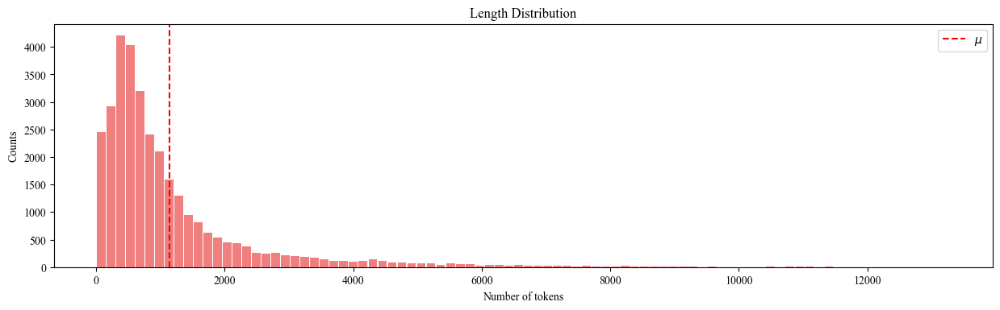

In [11]:
fig, ax = plt.subplots(1, figsize=(15,4), dpi=100)
ax.bar(x, hist, width=width*0.90, color='lightcoral')
ax.set_ylabel("Counts")
ax.set_xlabel("Number of tokens")
ax.set_title("Length Distribution")
ax.axvline(np.mean(corpus_len), c='red', label='$\mu$', linestyle='dashed')
ax.legend()
plt.show()

In [12]:
print(f'Average number of tokens in documents: {np.mean(corpus_len)}')
print(f'Median number of tokens in documents: {np.median(corpus_len)}')
print(f'Maximum number of tokens: {np.max(corpus_len)}')
print(f'Minimum number of tokens: {np.min(corpus_len)}')

Average number of tokens in documents: 1145.3853176470589
Median number of tokens in documents: 712.0
Maximum number of tokens: 13316
Minimum number of tokens: 1


It is definitely a bit peculiar that there exists a page with only a single token. Let us try to investigate that page and see if something could be wrong either with the API call or the text processing procedure.

In [13]:
corpus[corpus['#tokens']==1]

,CharacterName,TimeStamp,RawText,tokens,#tokens
1256,Bird-Man,2018,#redirect [[Ani-Men]],[redirect],1
2190,Brimstone Love,2020,#REDIRECT [[X-Men 2099]],[redirect],1
2960,Cerebra,2020,#REDIRECT [[X-Men 2099]],[redirect],1
3300,Cobalt Man,2020,#REDIRECT [[X-Men]],[redirect],1
4541,Devil-Slayer,2007,#REDIRECT [[Devil-Slayer]],[redirect],1
4700,D'Ken,2019,#REDIRECT [[Shi'ar]],[redirect],1
4927,Roger Dooley,2014,#redirect [[List_of_S.H.I.E.L.D._members#Forme...,[redirect],1
5979,Flipside,2008,#REDIRECT [[Spider-Man 2099]],[redirect],1
6272,Spike Freeman,2018,#redirect [[X-Statix]],[redirect],1
6684,John Garrett,2013,#redirect [[List_of_S.H.I.E.L.D._members#Forme...,[redirect],1


By inspecting the pages containing only a single token, it becomes evident that the majority of these pages only contains a redirect link, except one that is intentionally blank. These specific pages will be excluded from the remaining of the text analysis.

In [14]:
corpus[corpus['#tokens']<30]

,CharacterName,TimeStamp,RawText,tokens,#tokens
38,Achebe,2020,#REDIRECT [[Achebe (character)]]\n\n{{Redirect...,"[redirect, acheb, charact, redirect, categori,...",7
40,Agent,2013,#Redirect [[List of Marvel Comics characters: ...,"[redirect, list, marvel, comic, charact, agent...",22
44,Agent,2017,#Redirect [[List of Marvel Comics characters: ...,"[redirect, list, marvel, comic, charact, agent...",23
48,Agent,2018,#Redirect [[1989 in comics]]\n\n{{Rcat shell|\...,"[redirect, comic, rcat, r, fiction, comic, r, ...",19
88,Airstrike,2022,#REDIRECT [[Crimson Dynamo#Dmitri Bukharin]]\n...,"[redirect, crimson, dynamo, dmitri, bukharin, ...",9
...,...,...,...,...,...
31627,"von Gunther, Paula, Baroness",2007,#REDIRECT [[Baroness Paula Von Gunther]] {{R f...,"[redirect, baro, paula, von, gunther, r, capit...",7
31628,"von Gunther, Paula, Baroness",2012,#REDIRECT [[List of Wonder Woman enemies]] {{R...,"[redirect, list, wonder, woman, enemi, r, capi...",7
31629,"von Gunther, Paula, Baroness",2006,#REDIRECT [[Dark Angel (DC Comics)]],"[redirect, dark, angel, dc, comic]",5
31828,XS,2022,#REDIRECT [[XS (character)]]\n\n{{Redirect cat...,"[redirect, xs, charact, redirect, categori, r,...",7


It seems that multiple pages even with a greater number of tokens than 1 only contain a redirect to other pages. Let us try to find all pages that mentions redirect:

In [15]:
temp = corpus[corpus.RawText.str.lower().str.contains('redirect')]
temp

,CharacterName,TimeStamp,RawText,tokens,#tokens
38,Achebe,2020,#REDIRECT [[Achebe (character)]]\n\n{{Redirect...,"[redirect, acheb, charact, redirect, categori,...",7
40,Agent,2013,#Redirect [[List of Marvel Comics characters: ...,"[redirect, list, marvel, comic, charact, agent...",22
44,Agent,2017,#Redirect [[List of Marvel Comics characters: ...,"[redirect, list, marvel, comic, charact, agent...",23
46,Agent,2012,#Redirect [[List of Marvel Comics characters: ...,"[redirect, list, marvel, comic, charact, agent...",40
48,Agent,2018,#Redirect [[1989 in comics]]\n\n{{Rcat shell|\...,"[redirect, comic, rcat, r, fiction, comic, r, ...",19
...,...,...,...,...,...
31828,XS,2022,#REDIRECT [[XS (character)]]\n\n{{Redirect cat...,"[redirect, xs, charact, redirect, categori, r,...",7
31833,4-D,2022,{{redirect|Pulse 8|the Jme song|Integrity (alb...,"[jme, album, infobox, comic, organ, wikipedia,...",791
31843,4-D,2020,{{redirect|Pulse 8|the Jme song|Integrity (alb...,"[jme, album, infobox, comic, organ, wikipedia,...",800
31845,4-D,2021,{{redirect|Pulse 8|the Jme song|Integrity (alb...,"[jme, album, infobox, comic, organ, wikipedia,...",793


By inspecting the above rows it can be seen that some of the pages contain the word redirect but have in fact a body of descriptive text. Hence, we need to figure out a different way to sort out redirect pages.

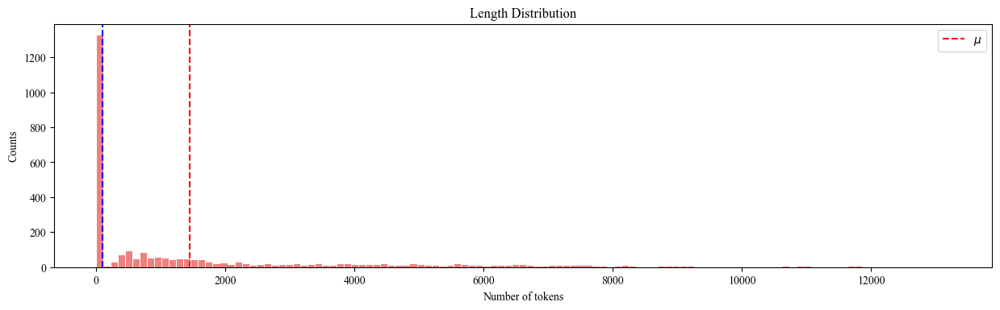

In [16]:
corpus_len = list(temp['#tokens'].values)
#Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
bins = np.arange(min(corpus_len), max(corpus_len), int(len(np.unique(corpus_len))/10))
hist, edges = np.histogram(corpus_len, bins=bins)#, density=True)
x = (edges[1:] + edges[:-1])/2
width = bins[1]-bins[0]
fig, ax = plt.subplots(1, figsize=(15,4), dpi=100)
ax.bar(x, hist, width=width*0.90, color='lightcoral')
ax.set_ylabel("Counts")
ax.set_xlabel("Number of tokens")
ax.set_title("Length Distribution")
ax.axvline(np.mean(corpus_len), c='red', label='$\mu$', linestyle='dashed')
ax.axvline(100, c='blue', linestyle='dashed')
ax.legend()
plt.show()

By inspecting the above histogram of the length of documents containing the word redirect, it can be seen that a great deal of the documents that contain the word redirect has a length below a 100 tokens. Let us try to inspect these documents:

In [17]:
max(temp[temp['#tokens']<100]['#tokens'])

56

The maximum number of words where the document contains the word redicerect and is below a 100 tokens is 56. Let us try to investigate the content of this page:

In [18]:
print(temp[temp['#tokens']==56].RawText.values)

['#REDIRECT [[Saturnyne]]\n\n{{Redirect category shell|\n{{R comics from merge}}\n}}\n\n[[Category:Female supervillains]]\n[[Category:Fictional dictators]]\n[[Category:Fictional murderers]]\n[[Category:Fictional rapists]]\n[[Category:Fictional impostors]]\n[[Category:Fictional characters who committed familicide]]\n[[Category:Fictional characters from parallel universes]]\n[[Category:Marvel Comics telepaths]]\n[[Category:Marvel Comics supervillains]]\n[[Category:Marvel UK characters]]\n[[Category:Psychopathy in fiction]]\n[[Category:Characters created by Alan Davis]]\n[[Category:Comics characters introduced in 1988]]']


Given that the content demonstrate no valuable information, we have decided to exclude everypages that contain the word redirect and where the number of tokens is equal or less than 56. We have also decided to remove the remaining pages with only one token:

In [15]:
mask = [not elem for elem in (corpus.RawText.str.lower().str.contains('redirect')) & (corpus['#tokens']<=56) |(corpus['#tokens']==1)]
corpusv2 = corpus[mask]

In [16]:
corpusv2.head()

,CharacterName,TimeStamp,RawText,tokens,#tokens
0,Abomination,2014,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",2192
1,Abomination,2019,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",2796
2,Abomination,2008,{{articleissues|cleanup=December 2008|in-unive...,"[infobox, comic, charact, wikipedia, wikiproje...",1115
3,Abomination,2005,{{Superherobox| <!--Wikipedia:WikiProject Comi...,"[wikipedia, wikiproject, comic, imag, abomin, ...",487
4,Abomination,2012,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",1872


Let us compute the length distribution once again with the subset of the data without redirects:

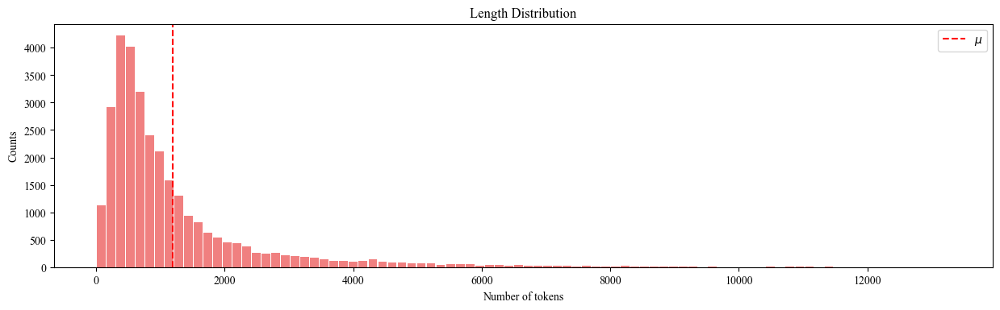

In [21]:
corpus_len = list(corpusv2['#tokens'].values)
#Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
bins = np.arange(min(corpus_len), max(corpus_len), int(len(np.unique(corpus_len))/30))
hist, edges = np.histogram(corpus_len, bins=bins)#, density=True)
x = (edges[1:] + edges[:-1])/2
width = bins[1]-bins[0]
fig, ax = plt.subplots(1, figsize=(15,4), dpi=100)
ax.bar(x, hist, width=width*0.90, color='lightcoral')
ax.set_ylabel("Counts")
ax.set_xlabel("Number of tokens")
ax.set_title("Length Distribution")
ax.axvline(np.mean(corpus_len), c='red', label='$\mu$', linestyle='dashed')
ax.legend()
plt.show()

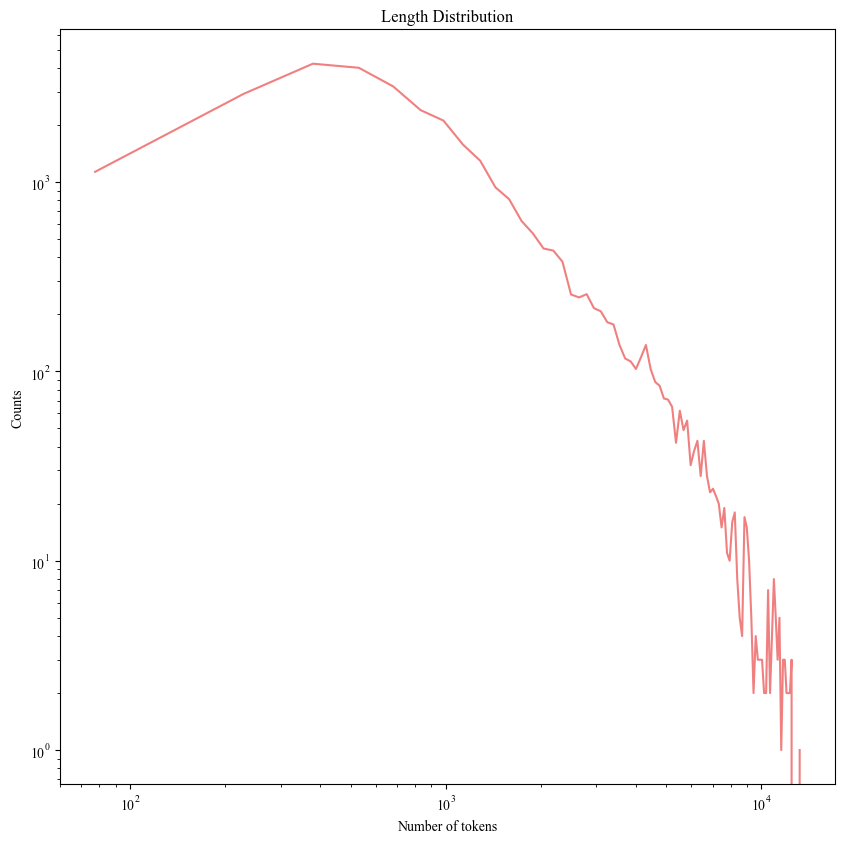

In [22]:
corpus_len = list(corpusv2['#tokens'].values)
#Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
bins = np.arange(min(corpus_len), max(corpus_len), int(len(np.unique(corpus_len))/30))
hist, edges = np.histogram(corpus_len, bins=bins)#, density=True)
x = (edges[1:] + edges[:-1])/2
width = bins[1]-bins[0]
fig, ax = plt.subplots(1, figsize=(10,10), dpi=100)
ax.plot(x, hist, color='lightcoral')
ax.set_ylabel("Counts")
ax.set_xlabel("Number of tokens")
ax.set_title("Length Distribution")
ax.set_yscale('log')
ax.set_xscale('log')
plt.show()

**We could also check if the distribution is log-normal**

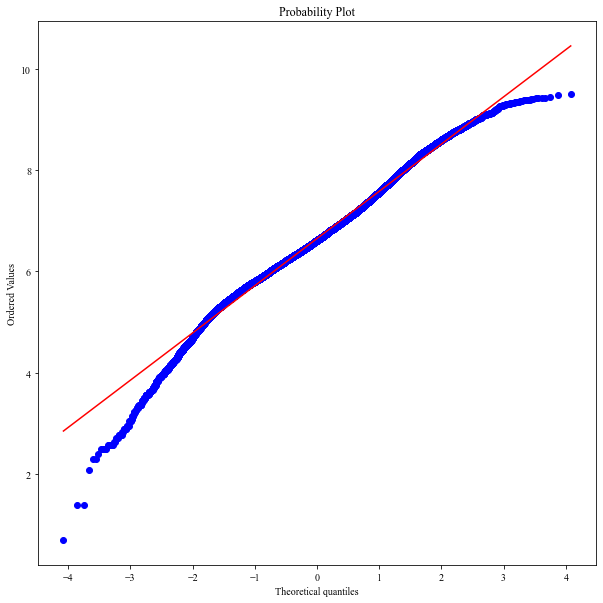

In [23]:
import pylab
import scipy.stats

fig, ax = plt.subplots(figsize=(10,10))
measurements = np.log(corpus_len)
scipy.stats.probplot(measurements, dist="norm", plot=ax)
plt.show()

It does not quite live up to the log normal distribution criteria.

In [24]:
min(measurements), max(measurements)

(0.6931471805599453, 9.496721598694915)

## Temporal Length Investigation
Lets try to investigate the length of Wikipedia pages as a function of time. It probably make most sense to normalize the sum, such that we don't just see an increase due to the number of pages that specific year but the actual average page length

In [25]:
yearly_token_count = corpusv2.groupby('TimeStamp').mean()

In [26]:
yearly_token_count

,#tokens
TimeStamp,
2001,224.272727
2002,311.227273
2003,269.339286
2004,277.296104
2005,472.343182
2006,618.165229
2007,714.422170
2008,804.984009
2009,910.366552


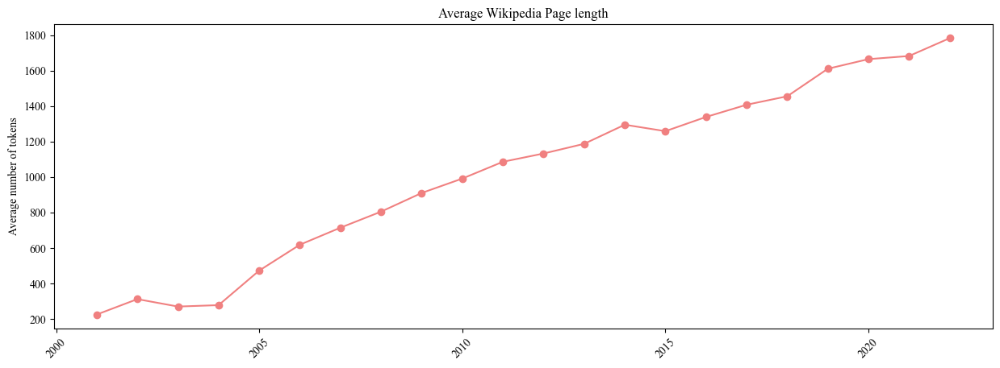

In [27]:
counts = list(yearly_token_count.values)
years = yearly_token_count.index
fig, ax = plt.subplots(figsize=(15,5), dpi=100)
ax.plot(years, counts,'-o', c='lightcoral')
ax.set_title('Average Wikipedia Page length')
ax.set_ylabel('Average number of tokens')
plt.xticks(rotation=45)
plt.show()

It seems that the length of superhero Wikipedia pages have experienced a linear increase.

### Length Analysis and Metadata Groups

In [7]:
meta_df = pd.read_csv('../metadataproject.csv')

In [8]:
meta_df.head()

,Unnamed: 0,CharacterName,WikiLink,universe,asian,latino,woman,black,man,good,bad
0,0,Abomination,Abomination (character),Marvel,0,0,0,0,1,0,1
1,1,Absorbing Man,Absorbing Man,Marvel,0,0,0,0,1,0,1
2,2,Achebe,Achebe (comics),Marvel,0,0,0,0,0,0,0
3,3,Agent,Agent (comics),Marvel,0,0,0,0,1,1,0
4,4,Agent X,Agent X (Marvel Comics),Marvel,0,0,0,0,1,1,0


Manipulating data into a more managerable data representation:

In [9]:
onehot = meta_df[['asian', 'latino', 'black']].values
equal_max = np.partition(onehot, -2)[:, -2:].T
default = -1 #-1 indicate no gender assignment
argmax = np.where(equal_max[0] != equal_max[1], np.argmax(onehot, -1), default)

In [10]:
race_map = {2:'black', 1:'latino', 0:'asian', -1:'unspecified'}
meta_df['race'] = argmax
meta_df["race"].replace(race_map, inplace=True)

In [11]:
onehot = meta_df[['woman', 'man']].values
equal_max = np.partition(onehot, -2)[:, -2:].T
default = -1 #-1 indicate no gender assignment
argmax = np.where(equal_max[0] != equal_max[1], np.argmax(onehot, -1), default)

sex_map = {0:'woman', 1:'man', -1:'unspecified'}
meta_df['sex'] = argmax
meta_df["sex"].replace(sex_map, inplace=True)

In [12]:
meta_df = meta_df[['CharacterName', 'WikiLink', 'universe', 'race', 'sex']]

In [13]:
meta_df.head()

,CharacterName,WikiLink,universe,race,sex
0,Abomination,Abomination (character),Marvel,unspecified,man
1,Absorbing Man,Absorbing Man,Marvel,unspecified,man
2,Achebe,Achebe (comics),Marvel,unspecified,unspecified
3,Agent,Agent (comics),Marvel,unspecified,man
4,Agent X,Agent X (Marvel Comics),Marvel,unspecified,man


In [14]:
extended_corpus = pd.merge(corpusv2, meta_df, left_on='CharacterName', right_on='CharacterName')

NameError: name 'corpusv2' is not defined

Now we can start with the analysis:

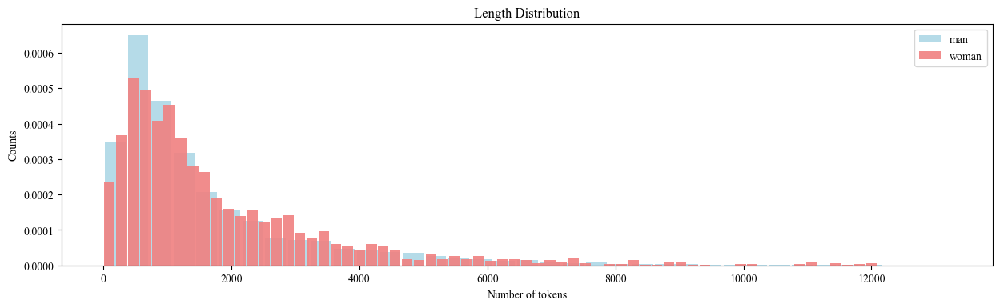

In [36]:
colors = ['lightblue', 'lightcoral']
fig, ax = plt.subplots(1, figsize=(15,4), dpi=100)
for i, sex in enumerate(['man', 'woman']):
    temp_corpus = extended_corpus[extended_corpus['sex']==sex]
    corpus_len = list(temp_corpus['#tokens'].values)
    #Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
    bins = np.arange(min(corpus_len), max(corpus_len), int(len(np.unique(corpus_len))/10))
    hist, edges = np.histogram(corpus_len, bins=bins, density=True)
    x = (edges[1:] + edges[:-1])/2
    width = bins[1]-bins[0]

    ax.bar(x, hist, width=width*0.90, color=colors[i], alpha=0.9, label=sex)
    ax.set_ylabel("Counts")
    ax.set_xlabel("Number of tokens")
    ax.set_title("Length Distribution")
    #ax.axvline(np.mean(corpus_len), c='red', label='$\mu$', linestyle='dashed')

ax.legend()
plt.show()

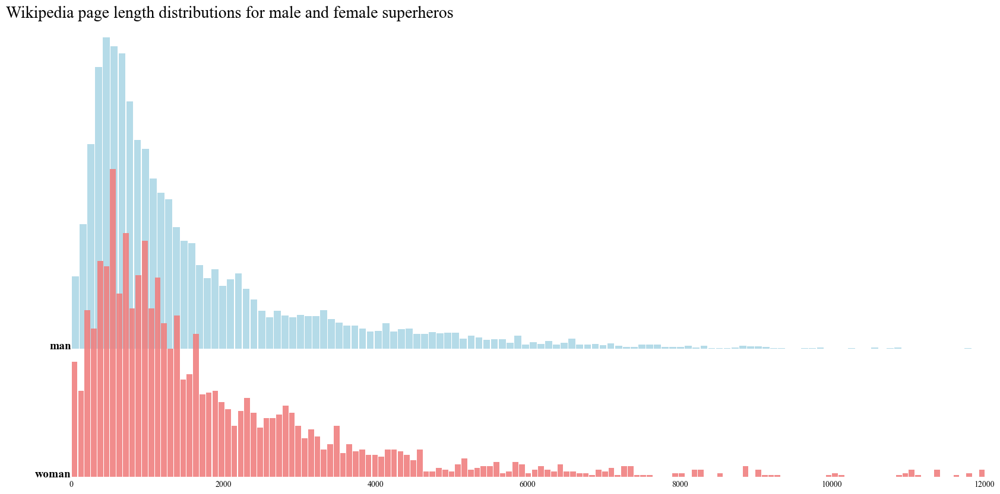

In [37]:
import matplotlib.gridspec as grid_spec
colors = ['lightblue', 'lightcoral']

gender = ['man', 'woman']
gs = grid_spec.GridSpec(len(gender),1)
fig = plt.figure(figsize=(20,10), dpi=100)
ax_objs = []
bin_groups = [35, 22]
for i, sex in enumerate(gender):
    temp_corpus = extended_corpus[extended_corpus['sex']==sex]
    corpus_len = list(temp_corpus['#tokens'].values)
    #Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
    bins = np.arange(min(corpus_len), max(corpus_len), int(len(np.unique(corpus_len))/bin_groups[i]))
    hist, edges = np.histogram(corpus_len, bins=bins, density=True)
    x = (edges[1:] + edges[:-1])/2
    width = bins[1]-bins[0]
    
    # creating new axes object
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

    # plotting the distribution
    ax_objs[-1].bar(x, hist, width=width*0.90, color=colors[i], alpha=0.9)
    
    #Might be an issue here
    # setting uniform x and y lims
    ax_objs[-1].set_xlim(0,12100)
    ax_objs[-1].set_ylim(0,0.0007)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)
    
    # remove borders, axis ticks, and labels
    ax_objs[-1].set_yticklabels([])

    # remove xticks labels
    if i != len(gender) - 1:
        ax_objs[-1].set_xticklabels([])
    
    # remove xticks
    ax_objs[-1].tick_params(axis=u'both', which=u'both',length=0)
    
    
    spines = ["top","right","left","bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)
    
    ax_objs[-1].text(-0.10,0.0, sex,fontweight="bold",fontsize=14,ha="right")
    

    
gs.update(hspace=-0.6)

fig.text(0.07,0.90,"Wikipedia page length distributions for male and female superheros",fontsize=20)
#plt.savefig('ridgeplot_test.png')
#plt.savefig('ridgeplot_test.png',bbox_inches='tight')
plt.show()
    

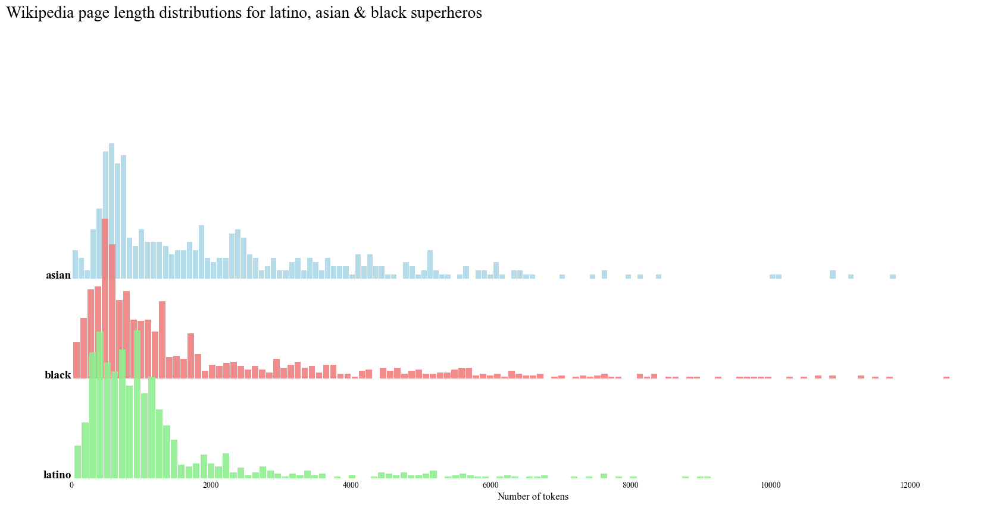

In [38]:
import matplotlib.gridspec as grid_spec
colors = ['lightblue', 'lightcoral', 'lightgreen']

races = ['asian', 'black', 'latino']
gs = grid_spec.GridSpec(len(races),1)
fig = plt.figure(figsize=(20,10), dpi=100)
ax_objs = []
bin_groups = [5, 8, 7]
for i, race in enumerate(races):
    temp_corpus = extended_corpus[extended_corpus['race']==race]
    corpus_len = list(temp_corpus['#tokens'].values)
    #Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
    bins = np.arange(min(corpus_len), max(corpus_len), int(len(np.unique(corpus_len))/bin_groups[i]))
    hist, edges = np.histogram(corpus_len, bins=bins, density=True)
    x = (edges[1:] + edges[:-1])/2
    width = bins[1]-bins[0]

    
    # creating new axes object
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

    # plotting the distribution
    ax_objs[-1].bar(x, hist, width=width*0.90, color=colors[i], alpha=0.9)
    
    #Might be an issue here
    # setting uniform x and y lims
    ax_objs[-1].set_xlim(0,13200)
    ax_objs[-1].set_ylim(0,0.0015)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)
    
    # remove borders, axis ticks, and labels
    ax_objs[-1].set_yticklabels([])

    # remove xticks labels
    if i == len(races)-1:
        ax_objs[-1].set_xlabel("Number of tokens", fontsize=12)
    else:
        ax_objs[-1].set_xticklabels([])
    
    # remove xticks
    ax_objs[-1].tick_params(axis=u'both', which=u'both',length=0)
    
    
    spines = ["top","right","left","bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)
    
    ax_objs[-1].text(-0.10,0.0, race,fontweight="bold",fontsize=14,ha="right")
    

    
gs.update(hspace=-0.6)

fig.text(0.07,0.90,"Wikipedia page length distributions for latino, asian & black superheros",fontsize=20)
#plt.savefig('ridgeplot_test.png')
#plt.savefig('ridgeplot_test.png',bbox_inches='tight')
plt.show()
    

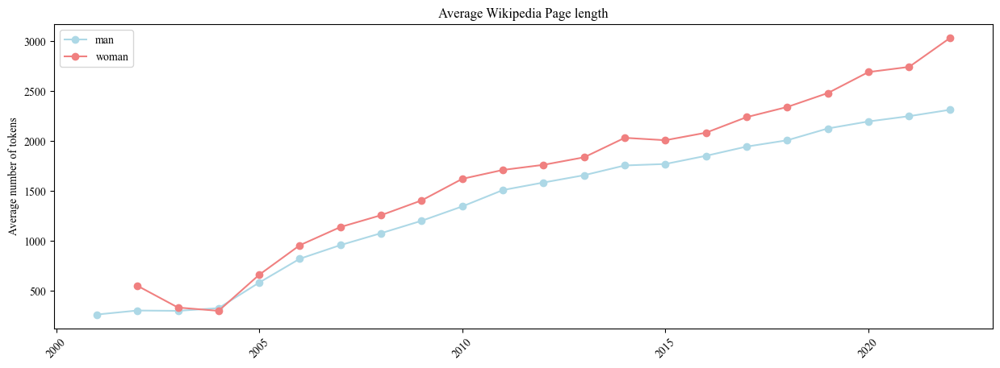

In [39]:
fig, ax = plt.subplots(figsize=(15,5), dpi=100)
for i, sex in enumerate(gender):
    temp_corpus = extended_corpus[extended_corpus['sex']==sex]
    yearly_token_count = temp_corpus.groupby('TimeStamp').mean()
    counts = list(yearly_token_count.values)
    years = yearly_token_count.index
    ax.plot(years, counts,'-o', c=colors[i], label=sex)
    ax.set_title('Average Wikipedia Page length')
    ax.set_ylabel('Average number of tokens')

ax.legend()
plt.xticks(rotation=45)
plt.show()

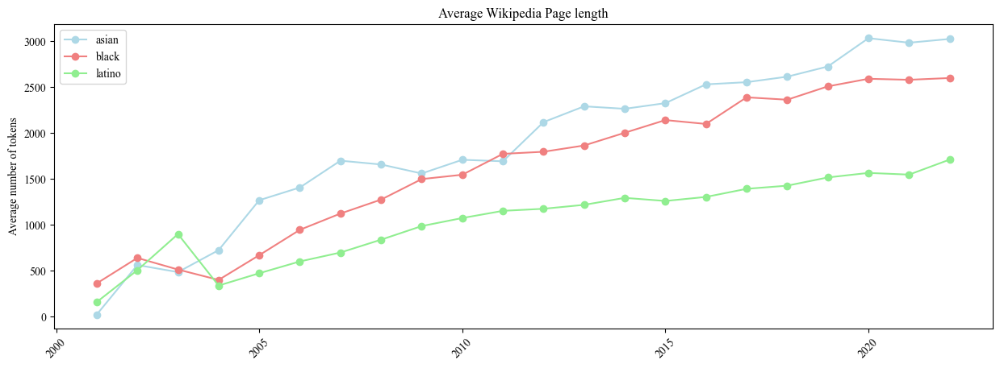

In [40]:
fig, ax = plt.subplots(figsize=(15,5), dpi=100)
for i, race in enumerate(races):
    temp_corpus = extended_corpus[extended_corpus['race']==race]
    yearly_token_count = temp_corpus.groupby('TimeStamp').mean()
    counts = list(yearly_token_count.values)
    years = yearly_token_count.index
    ax.plot(years, counts,'-o', c=colors[i], label=race)
    ax.set_title('Average Wikipedia Page length')
    ax.set_ylabel('Average number of tokens')

ax.legend()
plt.xticks(rotation=45)
plt.show()

## Number of Sections

NOTE: === .* === marks the begining of a section. Hence, this can be used to count the number of sections. To determine the number of sections in each document, we can use RegEx to find the number of occurences of the previous mentioned section marker.

Let us start by validating that the approach function on a single page, that are still accessable such that we can check that we get the correct number of sections.

In [41]:
re_pattern = r"\={2,3}.*\={2,3}"

In [42]:
temp_df = extended_corpus[extended_corpus.TimeStamp==2022]
temp_df.head()

,CharacterName,TimeStamp,RawText,tokens,#tokens,WikiLink,universe,race,sex
17,Abomination,2022,{{For|the biblical term|Abomination (Bible)}}\...,"[biblic, bibl, short, comic, fiction, charact,...",3286,Abomination (character),Marvel,unspecified,man
19,Absorbing Man,2022,{{Short description|Marvel Comics fictional ch...,"[short, comic, fiction, charact, infobox, comi...",2519,Absorbing Man,Marvel,unspecified,man
40,Agent,2022,{{Short description|Fictional character in Mar...,"[short, charact, marvel, comic, wikipedia, wik...",469,Agent (comics),Marvel,unspecified,man
53,Agent X,2022,{{short description|Fictional comic book chara...,"[short, comic, book, charact, use, agent, x, x...",1422,Agent X (Marvel Comics),Marvel,unspecified,man
96,Air-Walker,2022,{{short description|Fictional character appear...,"[short, charact, appear, american, comic, book...",608,Air-Walker,Marvel,unspecified,man


In [43]:
test_str = temp_df.RawText.values[0]
hero = temp_df.CharacterName.values[0]

In [44]:
re.findall(re_pattern, test_str)

['==Publication history==',
 '==Fictional character biography==',
 '==Powers and abilities==',
 '==Imitators==',
 '===Abominatrix===',
 '===Teen Abomination===',
 '===Reginald Fortean===',
 '==Other versions==',
 "===''JLA/Avengers''===",
 '===Ultimate Marvel===',
 "===''Abominations''===",
 "===''Mutant X''===",
 "===''Marvel Zombies''===",
 '==In other media==',
 '===Television===',
 '===Film===',
 '=== Marvel Cinematic Universe ===',
 '===Video games===',
 '===Toys===',
 '==See also==',
 '==References==',
 '==External links==']

In [45]:
hero

'Abomination'

It seems that we are capable of locating all the sections using the simple regex pattern. If one check the current wikipedia page for Abomination one will notice that there is one extra section that is not present in the discovered links or in the rawtext fetched from the wikipedia API, this must be a result of a newly created section that have been established after the API call was conducted.

Let us generalize the above script and determine the number of sections in each wikipedia page.


In [46]:
re_pattern = r"\={2,3}.*\={2,3}"
def no_sections(text):
    return len(re.findall(re_pattern, text))

In [47]:
extended_corpus['no_sections'] = extended_corpus.RawText.apply(lambda x: no_sections(x))

In [48]:
extended_corpus.head()

,CharacterName,TimeStamp,RawText,tokens,#tokens,WikiLink,universe,race,sex,no_sections
0,Abomination,2014,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",2192,Abomination (character),Marvel,unspecified,man,17
1,Abomination,2019,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",2796,Abomination (character),Marvel,unspecified,man,19
2,Abomination,2008,{{articleissues|cleanup=December 2008|in-unive...,"[infobox, comic, charact, wikipedia, wikiproje...",1115,Abomination (character),Marvel,unspecified,man,14
3,Abomination,2005,{{Superherobox| <!--Wikipedia:WikiProject Comi...,"[wikipedia, wikiproject, comic, imag, abomin, ...",487,Abomination (character),Marvel,unspecified,man,4
4,Abomination,2012,{{Infobox comics character\n<!--Wikipedia:Wiki...,"[infobox, comic, charact, wikipedia, wikiproje...",1872,Abomination (character),Marvel,unspecified,man,16


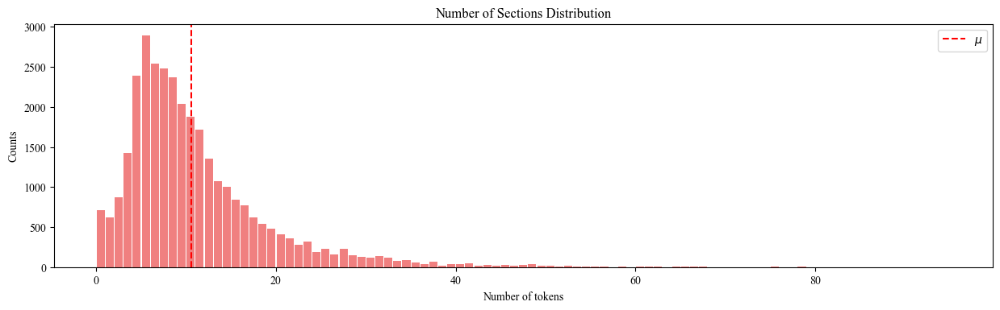

In [49]:
no_sections = list(extended_corpus['no_sections'].values)
#Due to the resolution of the data, we unfortunately have to decrease the resolution by aggregating the data
#bins = np.arange(min(no_sections), max(no_sections), int(len(np.unique(no_sections))/30))
bins = np.arange(min(no_sections), max(no_sections), 1)

hist, edges = np.histogram(no_sections, bins=bins)#, density=True)
x = (edges[1:] + edges[:-1])/2
width = bins[1]-bins[0]
fig, ax = plt.subplots(1, figsize=(15,4), dpi=100)
ax.bar(x, hist, width=width*0.90, color='lightcoral')
ax.set_ylabel("Counts")
ax.set_xlabel("Number of tokens")
ax.set_title("Number of Sections Distribution")
ax.axvline(np.mean(no_sections), c='red', label='$\mu$', linestyle='dashed')
ax.legend()
plt.show()

In [50]:
print(f'Average number of tokens in documents: {np.mean(no_sections)}')
print(f'Median number of tokens in documents: {np.median(no_sections)}')
print(f'Maximum number of tokens: {np.max(no_sections)}')
print(f'Minimum number of tokens: {np.min(no_sections)}')

Average number of tokens in documents: 10.55601363918165
Median number of tokens in documents: 8.0
Maximum number of tokens: 96
Minimum number of tokens: 0


It seems interesting that some wikipedia pages have very many sections. Let us try to investigate these pages and sanity check that there is in fact that many pages.

In [51]:
np.argmax(no_sections)

24004

In [52]:
extended_corpus.iloc[np.argmax(no_sections)]

CharacterName                                            Wolverine
TimeStamp                                                     2022
RawText          {{Short description|Marvel Comics fictional ch...
tokens           [short, comic, fiction, charact, kinney, whose...
#tokens                                                      13316
WikiLink         Wolverine (character)|Wolverine (Ultimate Marv...
universe                                                    Marvel
race                                                   unspecified
sex                                                            man
no_sections                                                     96
Name: 24004, dtype: object

https://en.wikipedia.org/wiki/Wolverine_(character) by inspecting the page of wolverine it becomes apperant that there is in fact a lot of sections!

### Histograms

In [53]:
import matplotlib.gridspec as grid_spec
from matplotlib.pyplot import cm
from tqdm.notebook import tqdm

def ridge_plot(extended_corpus, categories, group, y, title, step=1, hspace=0.5, agg=False, figsize=(20,10),
              cumulative=False):
    #determing xlim and ylim
    xmax = extended_corpus[y].values.max()
    
    temp = extended_corpus[y].values
    
    if agg:
        step = max(int(len(np.unique(temp))/20), 1)

    bins = np.arange(min(temp), max(temp), step)
    hist, edges = np.histogram(temp, bins=bins, density=True)
    ymax = np.histogram(temp, bins=bins, density=True)[0].max()
    
    n = len(categories)
    #cmap = cm.set2(np.linspace(0, 1, 2))
    colors = cm.rainbow(np.linspace(0, 1, n))
    gs = grid_spec.GridSpec(n,1)
    fig = plt.figure(figsize=figsize, dpi=100)
    ax_objs = []

    
    for i, category in tqdm(enumerate(categories)):
        temp_corpus = extended_corpus[extended_corpus[group]==category]
        metric = list(temp_corpus[y].values)
        
            
        if agg:
            step = max(int(len(np.unique(metric))/20), 1)
        
        bins = np.arange(min(metric), max(metric), step)
        hist, edges = np.histogram(metric, bins=bins, density=True)
        x = (edges[1:] + edges[:-1])/2
        width = bins[1]-bins[0]

        # creating new axes object
        ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

        # plotting the distribution
        if cumulative:
            hist = np.cumsum(hist)
            ax_objs[-1].bar(x, hist, width=width*0.90, color=colors[i], alpha=0.95)
            #ax_objs[-1].plot(x, hist, color=colors[i], alpha=0.95)
            #ax_objs[-1].hist(metric, bins, density=True,
            #               cumulative=True, histtype='step', color=colors[i], alpha=0.80)
        else:
            ax_objs[-1].bar(x, hist, width=width*0.90, color=colors[i], alpha=0.95)
        #Might be an issue here
        # setting uniform x and y lims
        ax_objs[-1].set_xlim(0,xmax)
        ax_objs[-1].set_ylim(0,ymax + 1e-2)

        # make background transparent
        rect = ax_objs[-1].patch
        rect.set_alpha(0)

        # remove borders, axis ticks, and labels
        ax_objs[-1].set_yticklabels([])

        # remove xticks labels
        if i != len(categories) - 1:
            ax_objs[-1].set_xticklabels([])
        else:
            ax_objs[-1].set_xlabel(f'{y}')

        # remove xticks
        ax_objs[-1].tick_params(axis=u'both', which=u'both',length=0)

        spines = ["top","right","left","bottom"]
        for s in spines:
            ax_objs[-1].spines[s].set_visible(False)

        ax_objs[-1].text(-0.10,0.0, category,fontweight="bold",fontsize=14,ha="right")



    gs.update(hspace=-hspace)

    fig.text(0.07,0.90, title,fontsize=20)
    
    #plt.savefig('ridgeplot_test.png')
    plt.savefig('ridgeplot_test.png',bbox_inches='tight')
    plt.show()
    return None

0it [00:00, ?it/s]

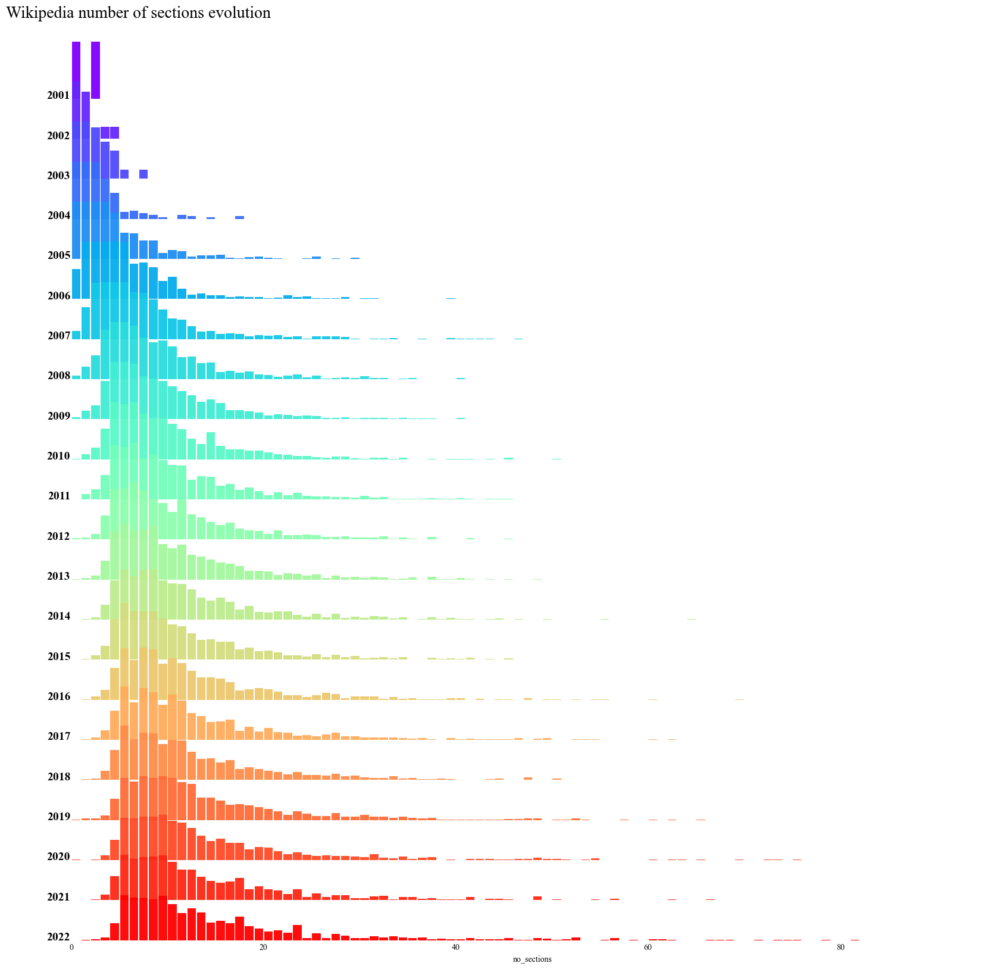

In [54]:
title = "Wikipedia number of sections evolution"
categories = extended_corpus.TimeStamp.sort_values().unique()
fig = ridge_plot(extended_corpus, categories, 'TimeStamp', 'no_sections', title, hspace=0.3, figsize=(20,20), cumulative=False)

0it [00:00, ?it/s]

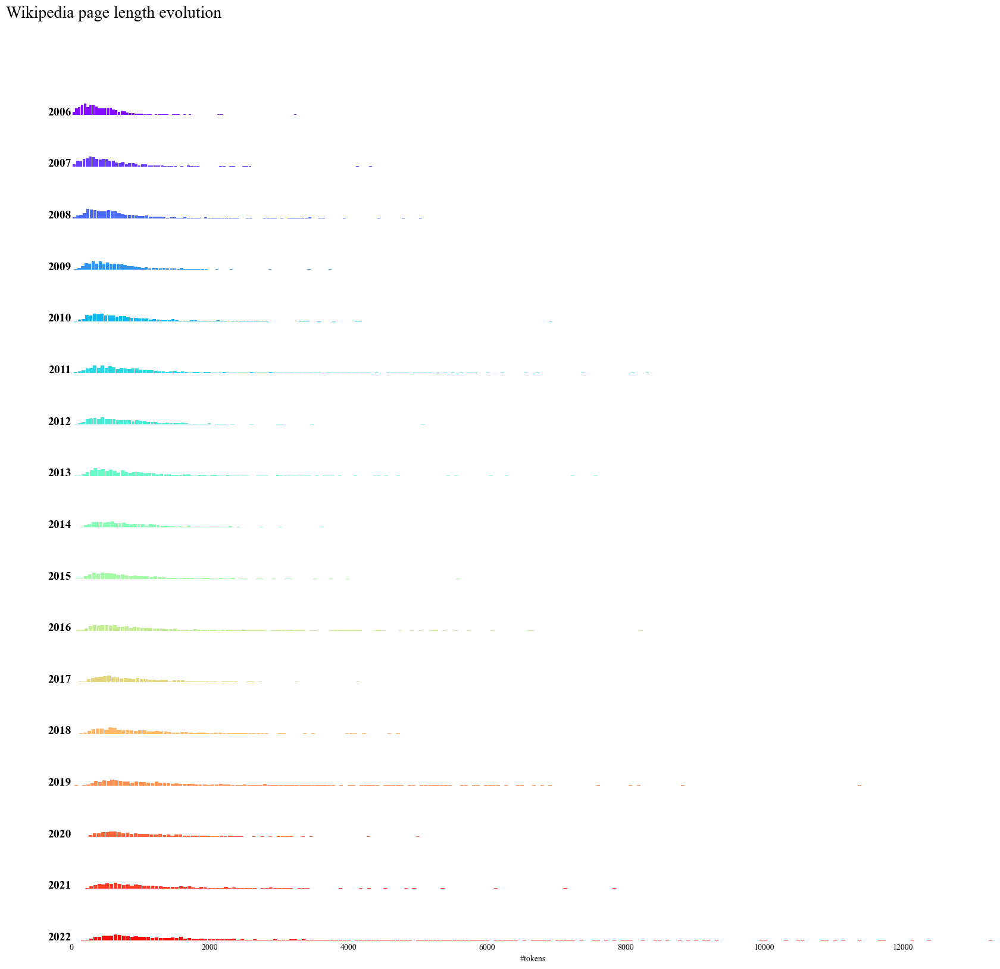

In [55]:
title = "Wikipedia page length evolution"
categories = extended_corpus.TimeStamp.sort_values().unique()[5:]
fig = ridge_plot(extended_corpus,
                 categories,
                 'TimeStamp',
                 '#tokens',
                 title,
                 hspace=0.3,
                 agg=True,
                 figsize=(20, 20),
                cumulative=False)

0it [00:00, ?it/s]

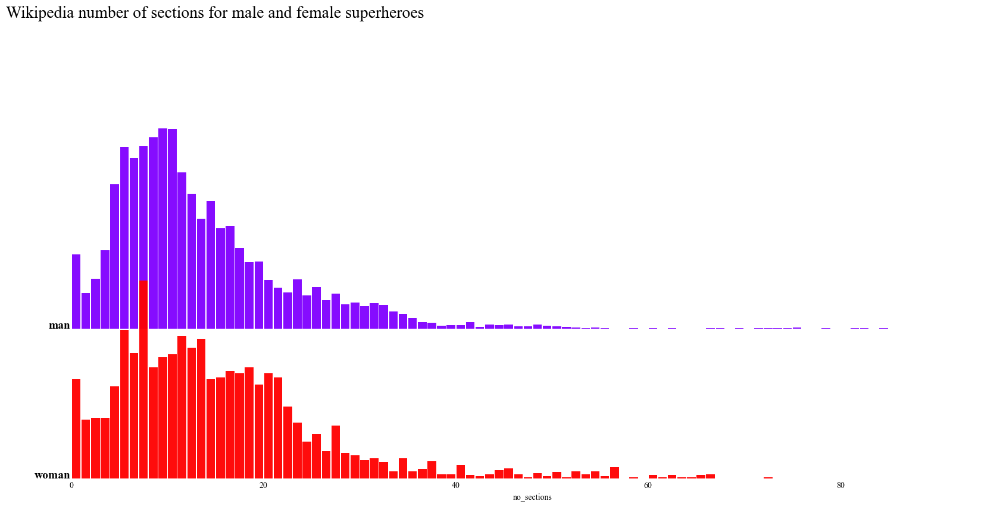

In [56]:
title = "Wikipedia number of sections for male and female superheroes"
categories = ['man', 'woman']
fig = ridge_plot(extended_corpus, categories, 'sex', 'no_sections', title)

0it [00:00, ?it/s]

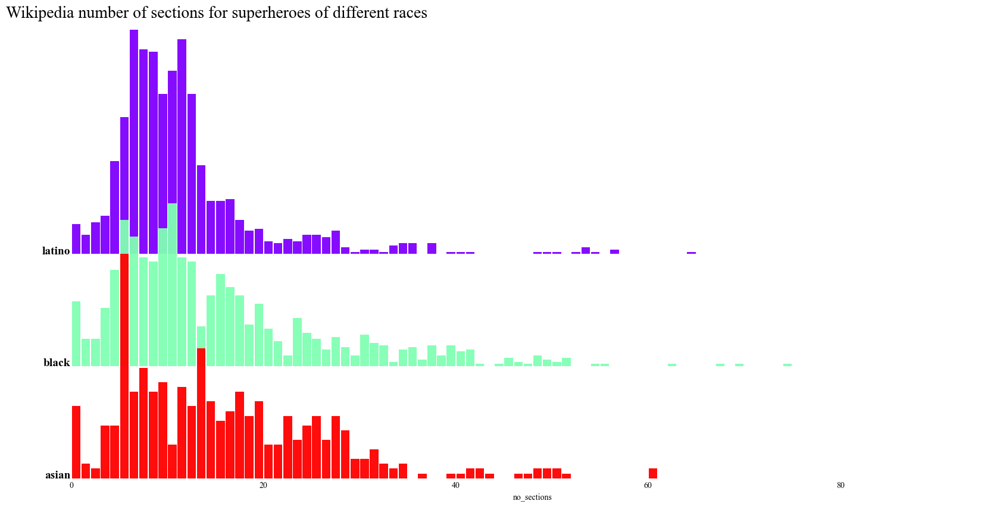

In [57]:
title = "Wikipedia number of sections for superheroes of different races"
categories = ['latino', 'black', 'asian']
fig = ridge_plot(extended_corpus, categories, 'race', 'no_sections', title)

### Lineplots

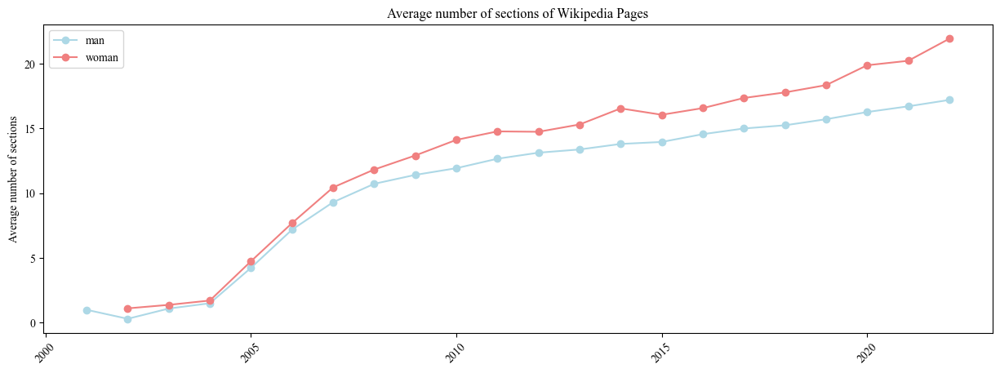

In [58]:
fig, ax = plt.subplots(figsize=(15,5), dpi=100)
for i, sex in enumerate(gender):
    temp_corpus = extended_corpus[extended_corpus['sex']==sex]
    yearly_section_count = temp_corpus.groupby('TimeStamp').mean().no_sections
    counts = list(yearly_section_count.values)
    years = yearly_section_count.index
    ax.plot(years, counts,'-o', c=colors[i], label=sex)
    ax.set_title('Average number of sections of Wikipedia Pages')
    ax.set_ylabel('Average number of sections')

ax.legend()
plt.xticks(rotation=45)
plt.show()

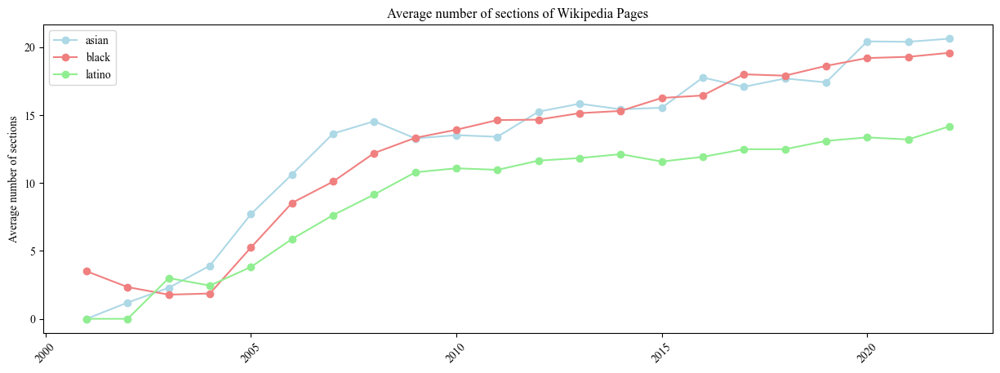

In [59]:
fig, ax = plt.subplots(figsize=(15,5), dpi=100)
for i, race in enumerate(races):
    temp_corpus = extended_corpus[extended_corpus['race']==race]
    yearly_section_count = temp_corpus.groupby('TimeStamp').mean().no_sections
    counts = list(yearly_section_count.values)
    years = yearly_section_count.index
    ax.plot(years, counts,'-o', c=colors[i], label=race)
    ax.set_title('Average number of sections of Wikipedia Pages')
    ax.set_ylabel('Average number of sections')

ax.legend()
plt.xticks(rotation=45)
plt.show()

## Correlation between Page length and number of sections

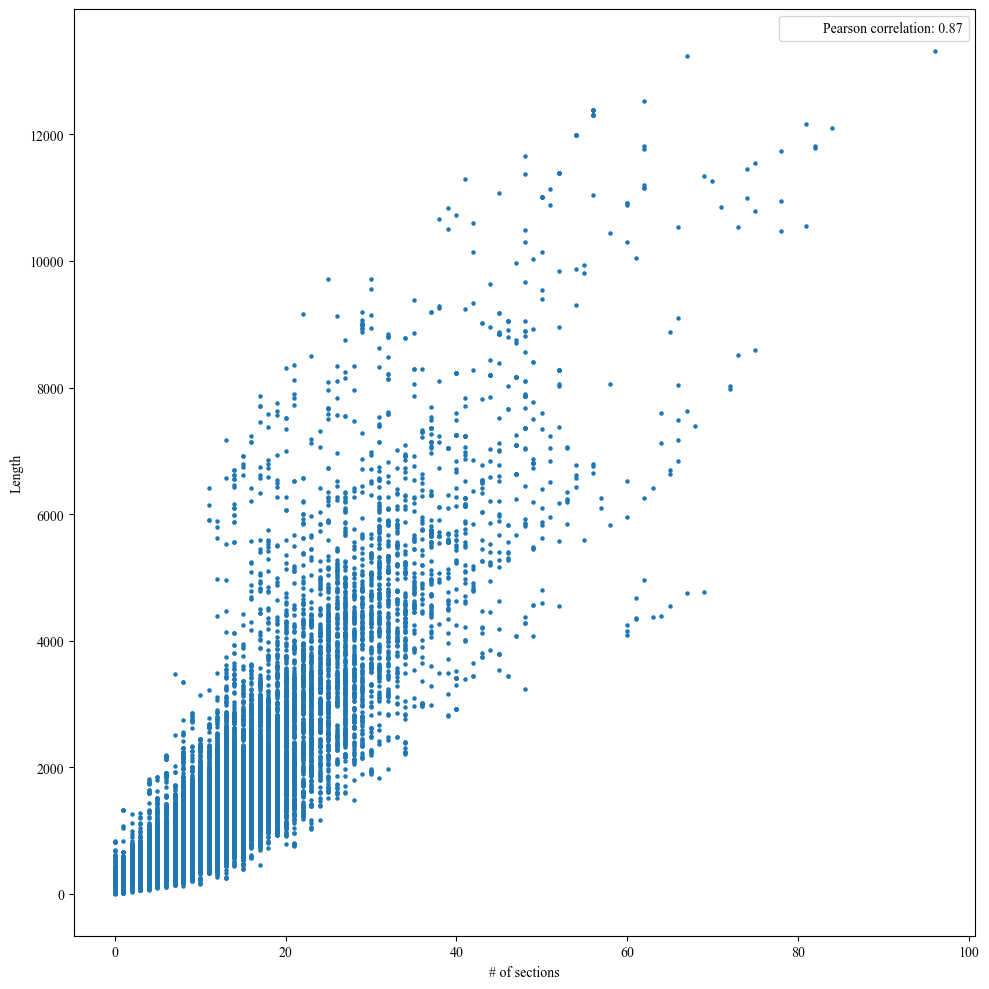

In [60]:
from scipy.stats import pearsonr

doc_lengths = extended_corpus['#tokens']
no_sections = extended_corpus['no_sections']

fig, ax = plt.subplots(figsize=(10,10), dpi=100)
ax.scatter(no_sections, doc_lengths, s=5)
ax.plot([],[],linestyle='None', label=f'Pearson correlation: {pearsonr(no_sections, doc_lengths)[0]:.2f}')
ax.set_ylabel('Length')
ax.set_xlabel('# of sections')
ax.legend()
fig.tight_layout()
plt.show()

## Document Similarity
TFIDF and cosine similarity

## Reordered Affinity Matrix

In [61]:
def identity_tokenizer(text):
    return text


corpus_2021 = extended_corpus[extended_corpus.TimeStamp==2021]


vectorizer = TfidfVectorizer(tokenizer=identity_tokenizer,
                         lowercase=False
                        )

X = vectorizer.fit_transform(corpus_2021['tokens'])


In [62]:
#Computing pairwise cosine similarity
from sklearn.metrics.pairwise import cosine_similarity
A = cosine_similarity(X)
#Setting diagonal to zero because we don't care about similarity between the same document.
np.fill_diagonal(A, 0.0)

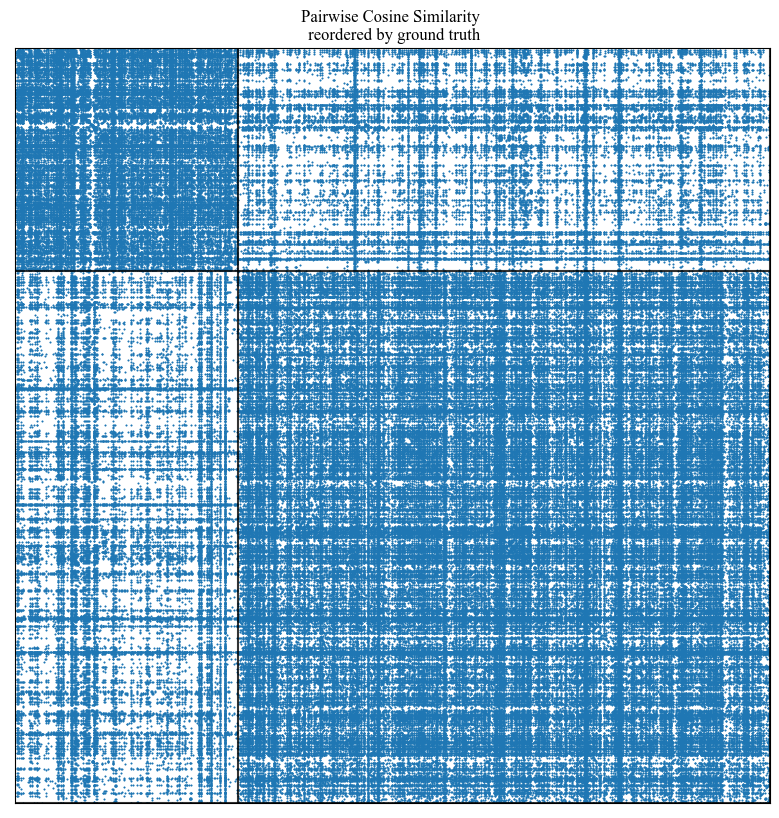

In [63]:
#Initially we will use the ground truth universe labels for the reordering
labels = corpus_2021['universe'].values
new_order = labels.argsort()

_, group_len = np.unique(labels, return_counts=True)


D = A[:, new_order][new_order]

fig, (ax1) = plt.subplots(figsize=(10,10), dpi=100)
#ax1.spy(D, precision=0.5, markersize=0.5)
ax1.spy(D, precision=0.1, markersize=0.5)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title("Pairwise Cosine Similarity \n reordered by ground truth")

y = labels
N = A.shape[0]
counts=np.unique(y,return_counts=True)[1]
counts_j=np.unique(y,return_counts=True)[1]
cum_i=np.cumsum(counts)
cum_j=np.cumsum(counts_j)

for i in range(cum_i.shape[0]):
    x1=np.array([cum_i[i],cum_i[i]])
    y1=np.array([[0,N]])
    line = plt.Line2D(y1, x1, lw=1.5, color='k', alpha=0.8)
    ax1.add_line(line)

for i in range(cum_i.shape[0]):
    x1=np.array([cum_j[i],cum_j[i]])
    y1=np.array([[0,N]])
    line = plt.Line2D(x1, y1, lw=1.5, color='k', alpha=0.8)
    ax1.add_line(line)

plt.show()



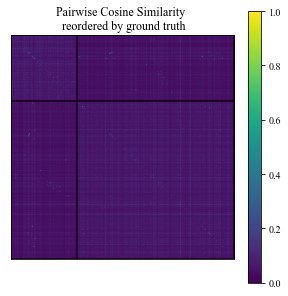

In [64]:
fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(D)
fig.colorbar(im)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Pairwise Cosine Similarity \n reordered by ground truth")

y = labels
N = A.shape[0]
counts=np.unique(y,return_counts=True)[1]
counts_j=np.unique(y,return_counts=True)[1]
cum_i=np.cumsum(counts)
cum_j=np.cumsum(counts_j)

for i in range(cum_i.shape[0]):
    x1=np.array([cum_i[i],cum_i[i]])
    y1=np.array([[0,N]])
    line = plt.Line2D(y1, x1, lw=1.5, color='black', alpha=0.8)
    ax.add_line(line)

for i in range(cum_i.shape[0]):
    x1=np.array([cum_j[i],cum_j[i]])
    y1=np.array([[0,N]])
    line = plt.Line2D(x1, y1, lw=1.5, color='black', alpha=0.8)
    ax.add_line(line)

plt.show()
plt.show()

Indicates marginal higher cosine similarity within the two universes but only marginal! Let us do this for each year:

In [65]:
from tqdm.notebook import tqdm

  0%|          | 0/22 [00:00<?, ?it/s]

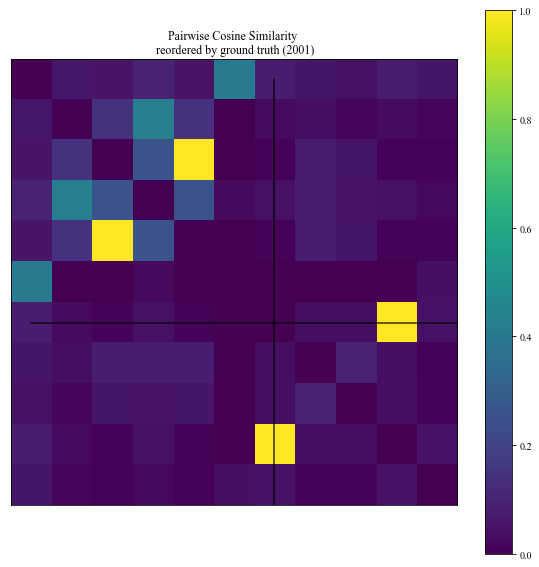

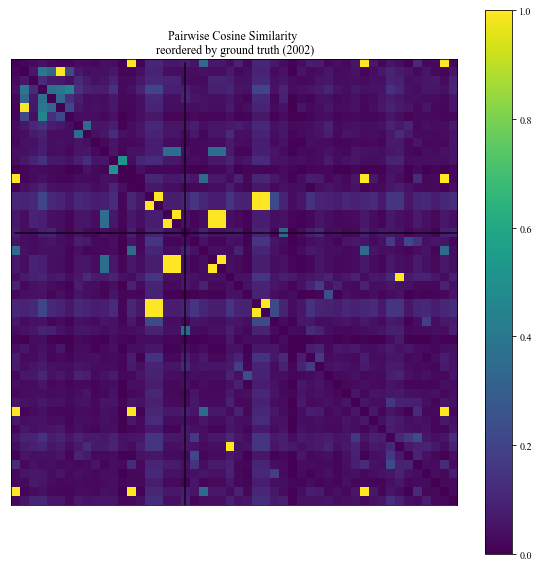

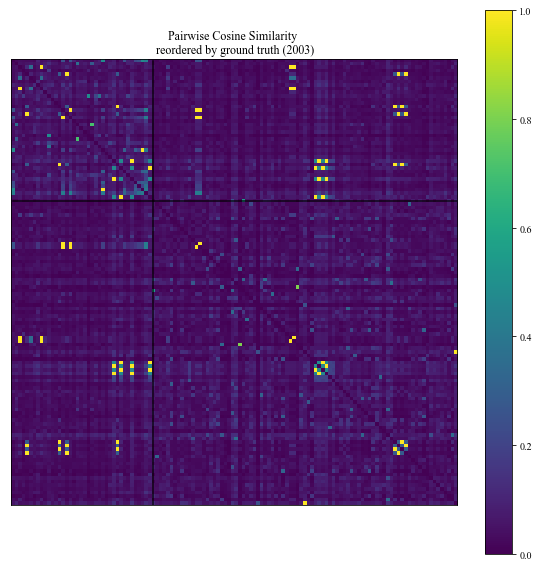

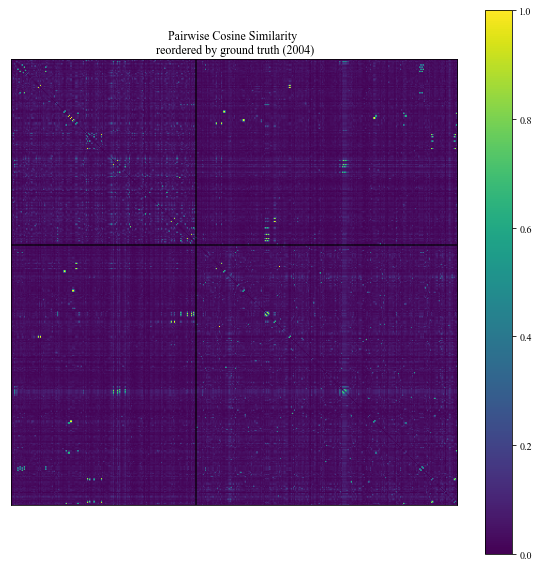

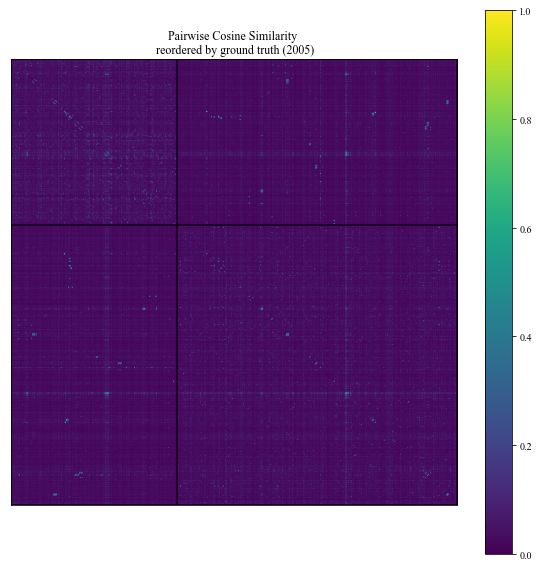

...

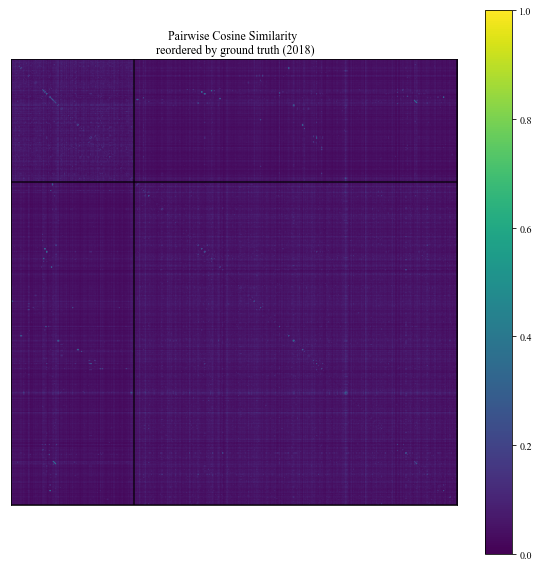

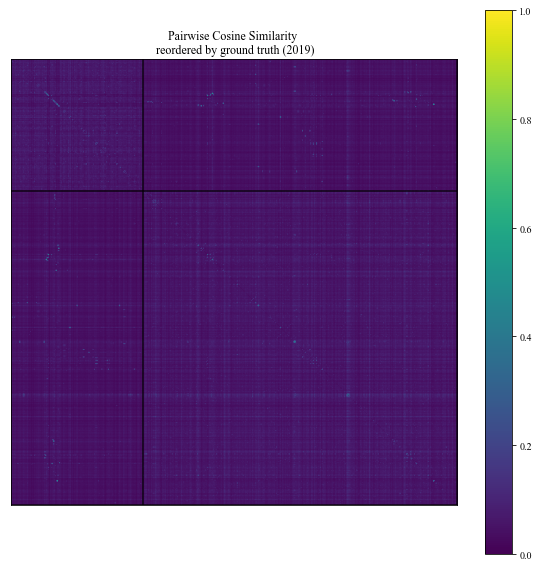

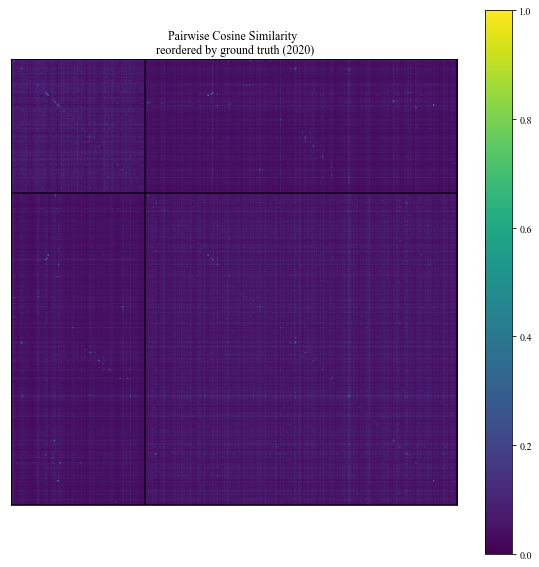

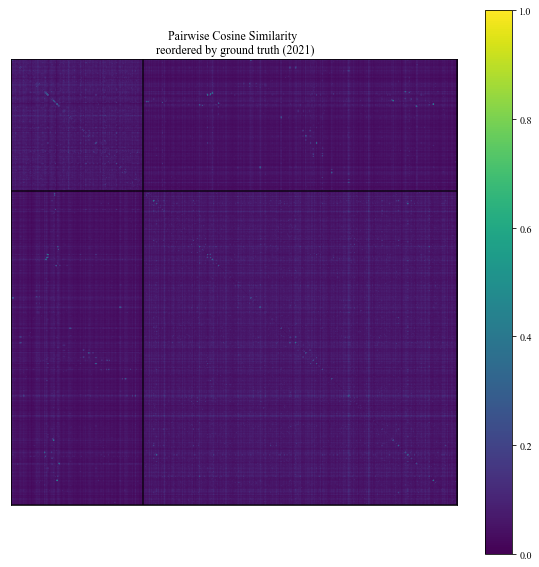

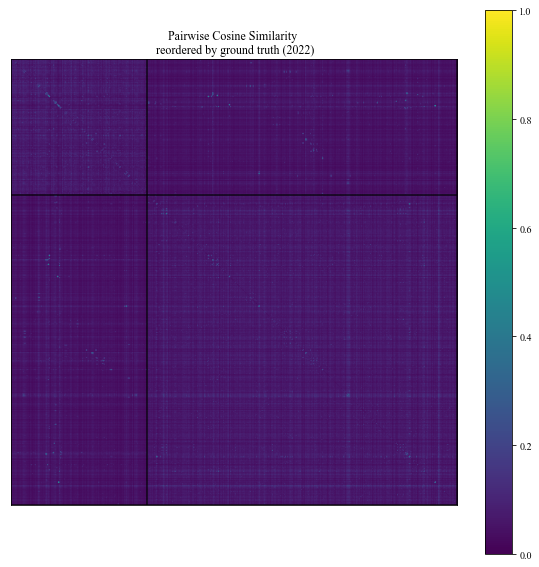

In [66]:
years = extended_corpus.TimeStamp.sort_values().unique()

def identity_tokenizer(text):
    return text

for year in tqdm(years):
    
    corpus_temp = extended_corpus[extended_corpus.TimeStamp==year]
    

    vectorizer = TfidfVectorizer(tokenizer=identity_tokenizer,
                             lowercase=False
                            )

    X = vectorizer.fit_transform(corpus_temp['tokens'])

    A = cosine_similarity(X)
    #Setting diagonal to zero because we don't care about similarity between the same document.
    np.fill_diagonal(A, 0.0)

    labels = corpus_temp['universe'].values
    new_order = labels.argsort()

    _, group_len = np.unique(labels, return_counts=True)


    D = A[:, new_order][new_order]

    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(D)
    fig.colorbar(im)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"Pairwise Cosine Similarity \n reordered by ground truth ({year})")

    y = labels
    N = A.shape[0]
    counts=np.unique(y,return_counts=True)[1]
    counts_j=np.unique(y,return_counts=True)[1]
    cum_i=np.cumsum(counts)
    cum_j=np.cumsum(counts_j)

    for i in range(cum_i.shape[0]):
        x1=np.array([cum_i[i],cum_i[i]])
        y1=np.array([[0,N]])
        line = plt.Line2D(y1, x1, lw=1.5, color='black', alpha=0.8)
        ax.add_line(line)

    for i in range(cum_i.shape[0]):
        x1=np.array([cum_j[i],cum_j[i]])
        y1=np.array([[0,N]])
        line = plt.Line2D(x1, y1, lw=1.5, color='black', alpha=0.8)
        ax.add_line(line)

    plt.show()

Ideas: 
* first show the heatmap, and then show the plt.spy to support claim of marginal difference.

* Test homophily property, (nodes tend to link to equivallent nodes) (probably best idea)

## Topic Modelling
LDA and wordclouds based on TFIDF

Lexical dispersion plot

### TF-IDF weighted wordclouds

In [67]:
yearly_tokens = extended_corpus.groupby('TimeStamp').agg({'tokens': 'sum'})

In [ ]:
years = extended_corpus.TimeStamp.sort_values().unique()

In [ ]:
yearly_tokens.loc[2001]

tokens    [short, superhero, charact, marvel, univers, s...
Name: 2001, dtype: object

  0%|          | 0/22 [00:00<?, ?it/s]

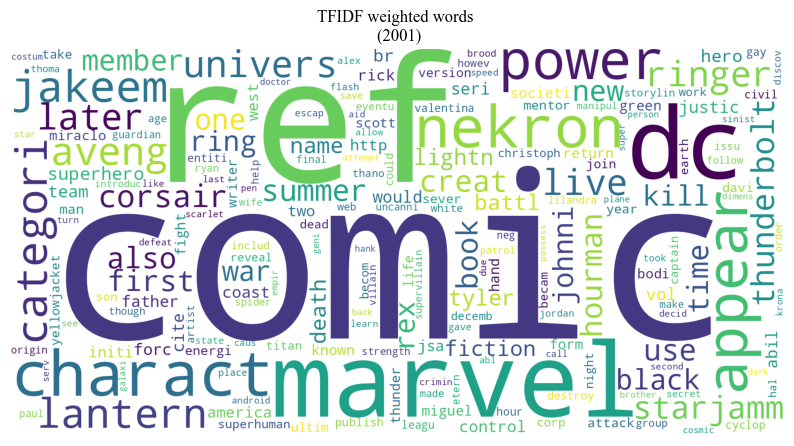

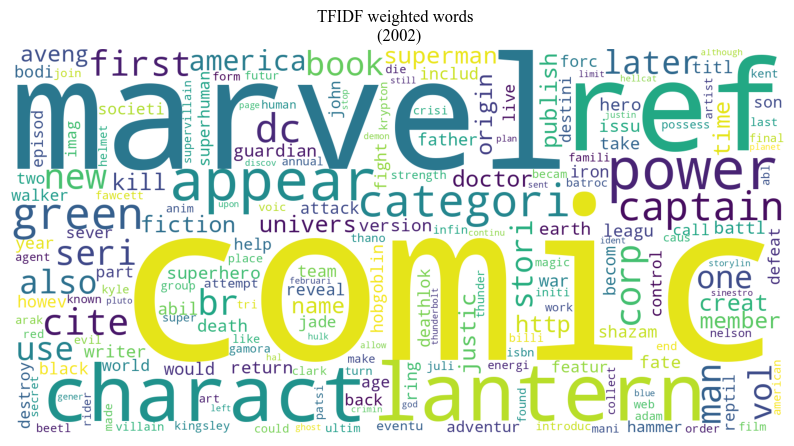

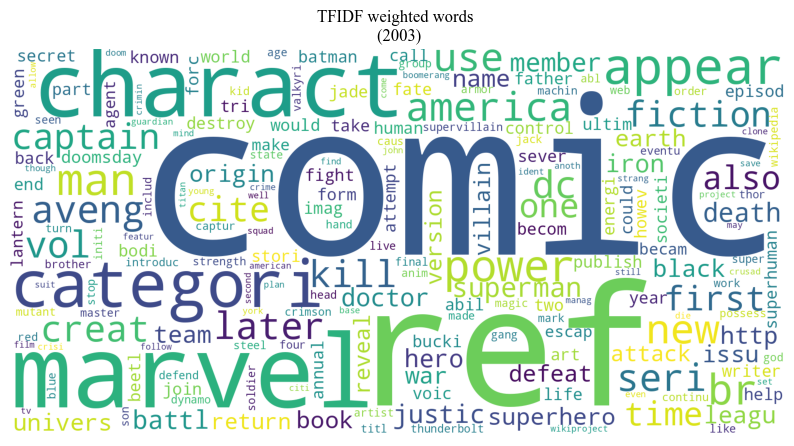

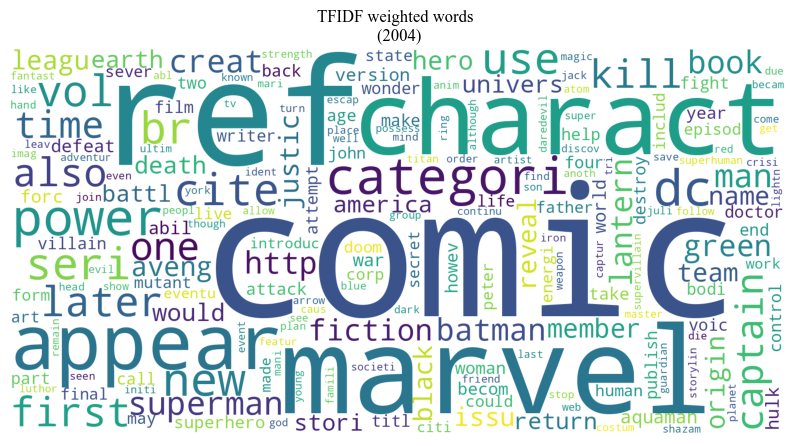

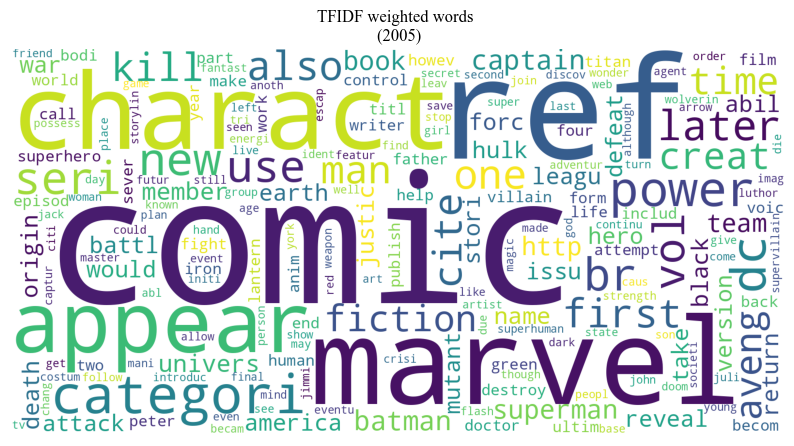

...

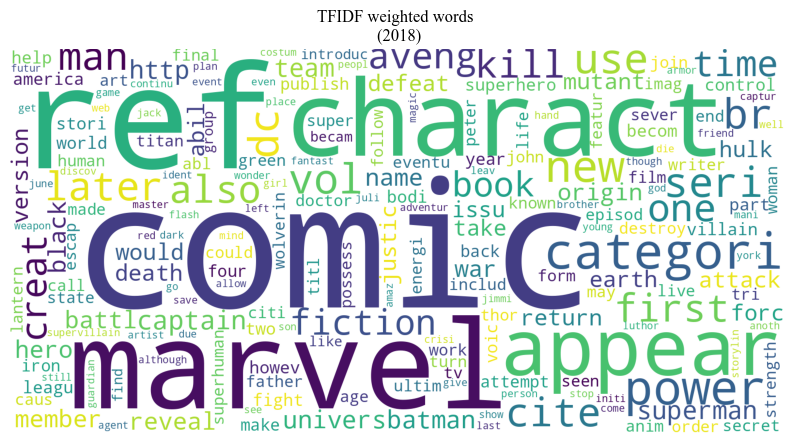

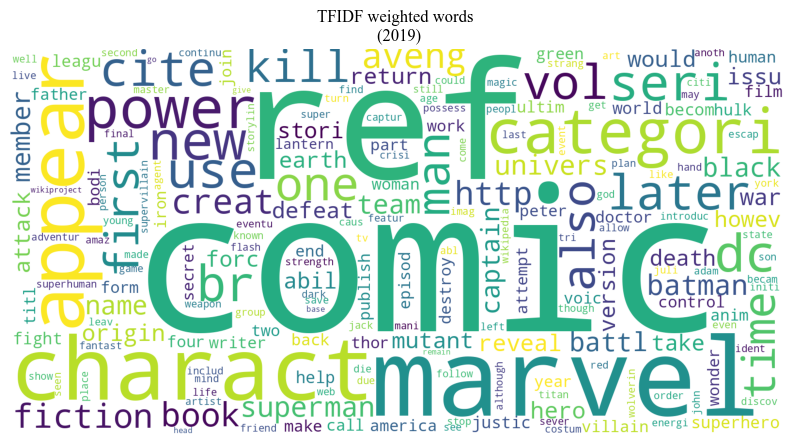

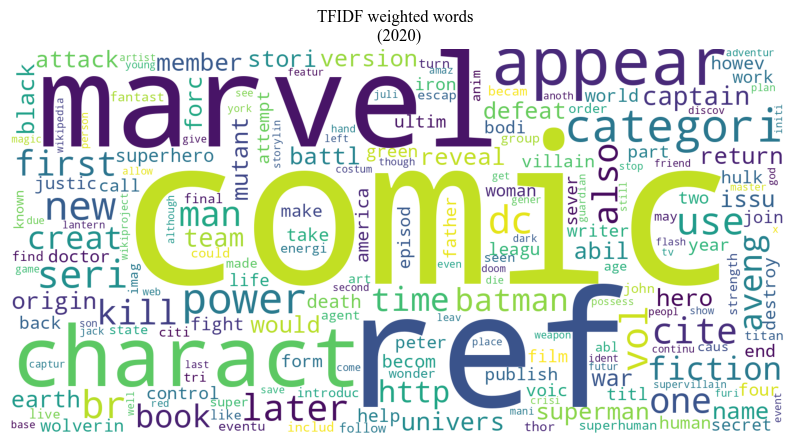

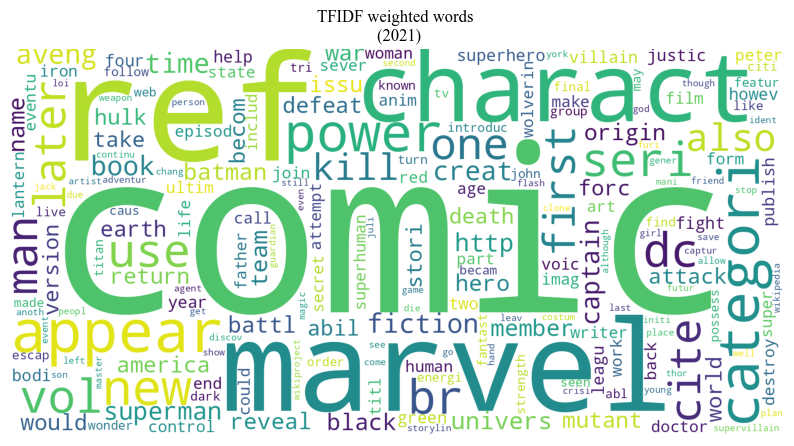

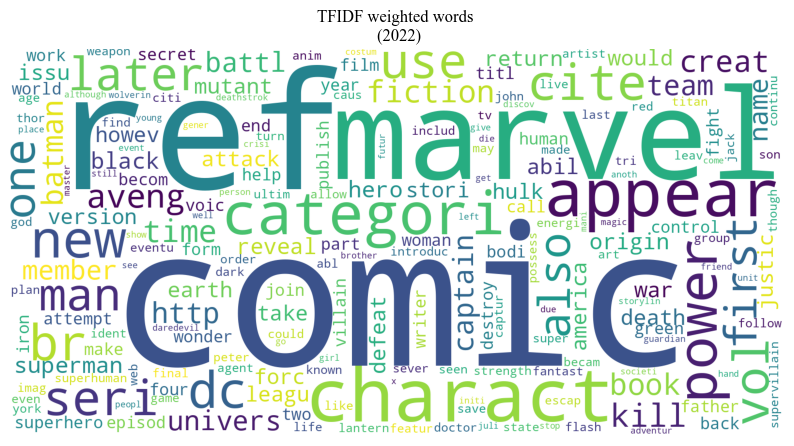

In [ ]:
def identity_tokenizer(text):   
    return text


for year in tqdm(years):

    vectorizer = TfidfVectorizer(tokenizer=identity_tokenizer,
                                 lowercase=False
                                )

    vecs = vectorizer.fit_transform(yearly_tokens.loc[year])
    feature_names = vectorizer.get_feature_names_out()
    dense = vecs.todense()
    lst1 = dense.tolist()
    TDM = pd.DataFrame(lst1, columns=feature_names).dropna()
    
    clust_cloud = WordCloud(background_color="white",
                            width=1600,
                            height=800).generate_from_frequencies(TDM.T.sum(axis=1))

    
    

    fig, ax = plt.subplots(figsize=(10,10), dpi=100)
    ax.imshow(clust_cloud)
    ax.axis("off")
    ax.set_title(f'TFIDF weighted words \n ({year})')
    plt.show()



### Lexical Dispersion plot
We will now try use lexical dispersion plots to highlight the temporal frequency of specific words:

In [ ]:
import plotly.io as pio
import plotly.graph_objs as go
import nltk

def word_frequency(word, start_date, end_date, df):

    df['date'] = pd.to_datetime(df['TimeStamp'], format='%Y')
    #df['date'] = df.TimeStamp
    mask = (df['date'] > start_date) & (df['date'] <= end_date)
    df = df.loc[mask]
    dates = df["date"].unique()
    freq_pr_day = {}
    for date in dates:
        temp = df[df['date']==date]
        doc = ' '.join(temp['RawText']).lower()
        words_ = nltk.tokenize.word_tokenize(doc.lower())
        freq_pr_day[date] = (len([x for x in words_ if x ==word])/len(words_)) * 1e5
    df = pd.DataFrame.from_dict(freq_pr_day, orient='index', columns=['count']).fillna(0)
    df['date'] = df.index
    return df

def create_bubblelines(words, start_date, end_date, df):
    '''
    Inspired from the following github
    https://github.com/wragge/hansard-language/blob/3f6c954d8fcc519bbde366241b6de84e3ca7cd58/analysis.py#L863
    '''
    traces = []
    for word in tqdm(words, total=len(words)):
        dates = []
        counts = []
        labels = []
        text = []
        results = word_frequency(word, start_date, end_date, df)
        for i in range(len(results)):
            dates.append(results.iloc[i,:]['date'])
            counts.append(results.iloc[i,:]['count'])
            text.append('{}*1e-5 uses'.format(results.iloc[i,:]['count']))
            labels.append(word)
        trace = dict(
            type='scatter',
            x=dates,
            y=labels,
            text=text,
            mode='markers',
            marker=dict(
                size=counts,
                opacity=0.4,
                sizemode="area"
            ),
            hoverinfo='x+text'
        )
        traces.append(trace)
    layout = go.Layout(
        yaxis=dict(
            tickfont=dict(
                size=10
            )
        ),
        margin=dict(
            l=120,
            r=80,
            t=100,
            b=100
        ),
        showlegend=False
    )
    figure = dict(data=traces, layout=layout)
    return figure


In [ ]:
extended_corpus.TimeStamp

0        2014
1        2019
2        2008
3        2005
4        2012
         ... 
32255    2007
32256    2016
32257    2014
32258    2015
32259    2008
Name: TimeStamp, Length: 32260, dtype: int64

In [ ]:
words = ['woman',
         'girl',
         'man',
         'boy',
         'female',
         'male']

start_date = "2000"
end_date = "2010"

fig = create_bubblelines(words, start_date, end_date, extended_corpus)
pio.show(fig)

  0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
#fig['data'][4]

{'type': 'scatter',
 'x': [Timestamp('2014-01-01 00:00:00'),
  Timestamp('2019-01-01 00:00:00'),
  Timestamp('2008-01-01 00:00:00'),
  Timestamp('2005-01-01 00:00:00'),
  Timestamp('2012-01-01 00:00:00'),
  Timestamp('2010-01-01 00:00:00'),
  Timestamp('2011-01-01 00:00:00'),
  Timestamp('2009-01-01 00:00:00'),
  Timestamp('2007-01-01 00:00:00'),
  Timestamp('2021-01-01 00:00:00'),
  Timestamp('2015-01-01 00:00:00'),
  Timestamp('2006-01-01 00:00:00'),
  Timestamp('2013-01-01 00:00:00'),
  Timestamp('2016-01-01 00:00:00'),
  Timestamp('2017-01-01 00:00:00'),
  Timestamp('2020-01-01 00:00:00'),
  Timestamp('2004-01-01 00:00:00'),
  Timestamp('2022-01-01 00:00:00'),
  Timestamp('2018-01-01 00:00:00'),
  Timestamp('2003-01-01 00:00:00'),
  Timestamp('2002-01-01 00:00:00'),
  Timestamp('2001-01-01 00:00:00')],
 'y': ['black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
  'black',
 

## Sentiment Analysis
Hedonometer

# Dimensionality Reduction

In [1]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [ ]:
#TF-IDF
#from ast import literal_eval
#extended_corpus['tokens'] = extended_corpus['tokens'].apply(literal_eval)

NameError: name 'extended_corpus' is not defined

Let us start by narrowing the scope to 2021.

In [ ]:
corpus_2021 = extended_corpus[extended_corpus.TimeStamp==2021]
corpus_2021.head()

In [ ]:
def identity_tokenizer(text):
    return text

vectorizer = TfidfVectorizer(tokenizer=identity_tokenizer,
                             lowercase=False
                            )

vecs = vectorizer.fit_transform(corpus_2021['tokens'])
feature_names = vectorizer.get_feature_names_out()
#dense = vecs.todense()
#lst1 = dense.tolist()
#TDM = pd.DataFrame(lst1, columns=feature_names).dropna()
X = vecs


## UMAP

In [ ]:
import umap.umap_ as umap

In [ ]:
X_umap = umap.UMAP(metric='cosine').fit_transform(X)

In [ ]:
male_idx = corpus_2021['sex']=='man'
female_idx = corpus_2021['sex']=='woman'

fig, ax = plt.subplots(1,figsize=(20,10), dpi=100)
ax.scatter(X_umap.T[0,:][male_idx], X_umap.T[1,:][male_idx], c='lightcoral',s=5, label='male')
ax.scatter(X_umap.T[0,:][female_idx], X_umap.T[1,:][female_idx], c='lightblue',s=5, label='female')
ax.set_title('UMAP embedding')
ax.legend()
plt.show()


In [ ]:
marvel_idx = corpus_2021['universe']=='Marvel'
dc_idx = corpus_2021['universe']=='DC'

fig, ax = plt.subplots(1,figsize=(20,10), dpi=100)
ax.scatter(X_umap.T[0,:][marvel_idx], X_umap.T[1,:][marvel_idx], c='lightcoral',s=5, label='Marvel')
ax.scatter(X_umap.T[0,:][dc_idx], X_umap.T[1,:][dc_idx], c='lightblue',s=5, label='DC')
ax.set_title('UMAP embedding')
ax.legend()
plt.show()

This is actually interesting! Using just the TF-IDF representation of each document performing dimensionality reduction of the document-term matrix yields two seperate clusters corresponding to Marvel and DC, respectively. Let us try to make the above plot a bit more informative:

In [ ]:
import plotly.express as px

In [ ]:
X_umap.shape

In [ ]:
corpus_2021['x'] = X_umap[:,0]
corpus_2021['y'] = X_umap[:,1]

In [ ]:
fig_2d = px.scatter(
    corpus_2021, x='x', y='y',
    color=corpus_2021.universe,
    labels={'color': 'universe'},
    hover_name='CharacterName',
    hover_data=['sex', 'race'],
    color_discrete_sequence=['lightcoral', 'darkblue']
)

In [ ]:
fig_2d.show()

Let us make it in 3d just for fun:

In [ ]:
import umap.umap_ as umap
X_umap = umap.UMAP(n_components=3, metric='cosine').fit_transform(X)

In [ ]:
corpus_2021['x3'] = X_umap[:,0]
corpus_2021['y3'] = X_umap[:,1]
corpus_2021['z3'] = X_umap[:,2]
corpus_2021['dummy_column_for_size'] = 1.

In [ ]:
fig_3d = px.scatter_3d(
    corpus_2021, x='x3', y='y3', z='z3',
    color=corpus_2021.universe,
    labels={'color': 'universe'},
    hover_name='CharacterName',
    hover_data=['sex', 'race'],
    color_discrete_sequence=['lightcoral', 'darkblue'],
    size='dummy_column_for_size',
    size_max=15,
    width=1000, 
    height=500
)

In [ ]:
#fig_3d.show()

In [ ]:
fig_3d.write_html("corpus_2021.html")

## PCA

In [ ]:
from sklearn import decomposition

In [ ]:
pca = decomposition.PCA(n_components=2)
pca.fit(X.toarray())
X_pca = pca.transform(X.toarray())

In [ ]:
X.shape

In [ ]:
marvel_idx = corpus_2021['universe']=='Marvel'
dc_idx = corpus_2021['universe']=='DC'

fig, ax = plt.subplots(1,figsize=(10,5), dpi=100)
ax.scatter(X_pca.T[0,:][marvel_idx], X_pca.T[1,:][marvel_idx], c='lightcoral',s=corpus_2021['#tokens'][marvel_idx]/1000, label='Marvel')
ax.scatter(X_pca.T[0,:][dc_idx], X_pca.T[1,:][dc_idx], c='darkblue',s=corpus_2021['#tokens'][dc_idx]/1000, label='DC')
ax.set_title('PCA of TF-IDF Weighted Document-Term Matrix\n (2021)')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.legend()
plt.show()

# Text Clustering

# Combining Network Science and Text mining tools

- Degree vs length
- Sentiment bad and good alignment
- Classic - Community + word clouds

# Predicting alignment based on metadata

To investigate if any biases might be present in the marvel/dc universe we will try to predict the alignment based on the metadata. First let us investigate if there is any correlation between the features.

In [ ]:
def cramers_v(x, y):
    #https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

NameError: name 'meta' is not defined

# Drafts

In [ ]:
wikipage = scan_folder(path_folder + 'Ares' + '/')
raw_text = wikipage[0][1]
raw_text = raw_text.split('}}')[1].split('\n\n==References==\n')[0]

In [ ]:
raw_text

In [ ]:
re.findall("^\{\{(.|\n)+\}\}\n\n?((.|\n)*)\n\n==References==\n", raw_text)[0]

In [ ]:
raw_text.split('}}')[1]

In [ ]:
'(?=\{Infobox(\{([^{}]|(?1))*\})'

In [ ]:
raw_text

In [ ]:
re.findall(, raw_text)

In [ ]:
import re

text = wikipages[0][1]

re_pattern = "\{\{\}\}\n.+\n((.|\n)*)\n\n==References==\n"
match = re.search(re_pattern,text)


In [ ]:
match.group(0)

In [ ]:
test = "\n{{Correct title|title=#711|reason=hash}}\n'''#711''' asdfasdfasdf \n\n==References==\n"

In [ ]:
match = re.findall('\{\{(.+)\}\}(.+?)\n\n==References==\n',text)

In [ ]:
match

In [ ]:
temp = re.findall('\{\{.+\}\}\n\'((.|\n)*)\n\n==References==\n', text)

In [ ]:
temp